<a href="https://colab.research.google.com/github/tarisnyastamas/Deep_Learning/blob/main/L2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import torchvision


from skimage import io
import skimage.transform as sktr
import skimage.util as skutil

from PIL import Image

import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt

from os import path

from sklearn.metrics import confusion_matrix


# Dataset - Pascal VOC

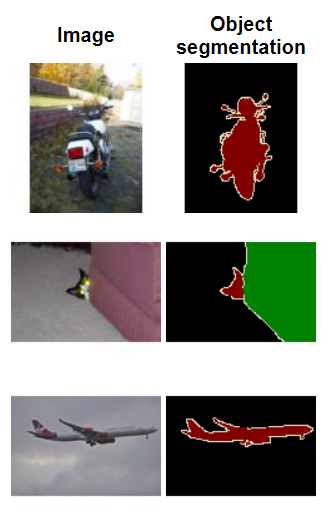

#### Classes:

(1=aeroplane, 2=bicycle, 3=bird, 4=boat, 5=bottle, 6=bus, 7=car , 8=cat, 9=chair, 10=cow, 11=diningtable, 12=dog, 13=horse, 14=motorbike, 15=person, 16=potted plant, 17=sheep, 18=sofa, 19=train, 20=tv/monitor)

In [ ]:
# download the dataset:
!mkdir /content/data_2012
!wget "http://pjreddie.com/media/files/VOCtrainval_11-May-2012.tar" -O /content/data_2012/VOCtrainval_11-May-2012.tar
download=True

--2021-03-31 15:11:11--  http://pjreddie.com/media/files/VOCtrainval_11-May-2012.tar
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://pjreddie.com/media/files/VOCtrainval_11-May-2012.tar [following]
--2021-03-31 15:11:11--  https://pjreddie.com/media/files/VOCtrainval_11-May-2012.tar
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1999639040 (1.9G) [application/octet-stream]
Saving to: ‘/content/data_2012/VOCtrainval_11-May-2012.tar’

/content/data_2012/ 100%[===================>]   1.86G  9.04MB/s    in 2m 1s   

2021-03-31 15:13:13 (15.7 MB/s) - ‘/content/data_2012/VOCtrainval_11-May-2012.tar’ saved [1999639040/1999639040]



In [ ]:
class ToTensorTarget(object):
    def __call__(self, target):
        target = torch.as_tensor(np.array(target), dtype=torch.int64)
        target[target==255] = 0
        return target

size = (64, 128)
transform_img = torchvision.transforms.Compose([
    torchvision.transforms.CenterCrop((200, 400)),
    torchvision.transforms.Resize(size),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5, 0.5, 0.5,), 
                                     (0.5, 0.5, 0.5,))
])

transform_target = torchvision.transforms.Compose([
    torchvision.transforms.CenterCrop((200, 400)),
    torchvision.transforms.Resize(size),
    ToTensorTarget()
])
    

In [ ]:
download = True
trainset = torchvision.datasets.VOCSegmentation(root="./data_2012", year='2012', image_set='train', download=download, transform=transform_img, target_transform=transform_target)
valset = torchvision.datasets.VOCSegmentation(root="./data_2012", year='2012', image_set='val', download=download, transform=transform_img, target_transform=transform_target)

Using downloaded and verified file: ./data_2012/VOCtrainval_11-May-2012.tar
Extracting ./data_2012/VOCtrainval_11-May-2012.tar to ./data_2012
Using downloaded and verified file: ./data_2012/VOCtrainval_11-May-2012.tar
Extracting ./data_2012/VOCtrainval_11-May-2012.tar to ./data_2012


In [ ]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=32,
                                         shuffle=True, num_workers=1)
valloader = torch.utils.data.DataLoader(valset, batch_size=32,
                                         shuffle=False, num_workers=1)

In [ ]:
def create_colormap(pascal):
  target = Image.open(pascal.masks[0])
  palette = np.array(target.getpalette())
  palette = palette.reshape((-1, 3)) / 255.
  cmap = mpl.colors.ListedColormap(palette, name="VOCClasses")
  norm = mpl.colors.BoundaryNorm(np.arange(257)-0.5, cmap.N)
  return cmap, norm
  
cmap_voc, norm_voc = create_colormap(trainset)

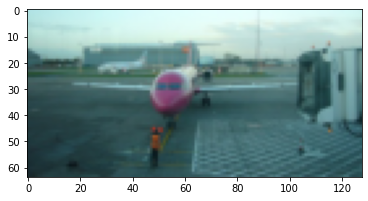

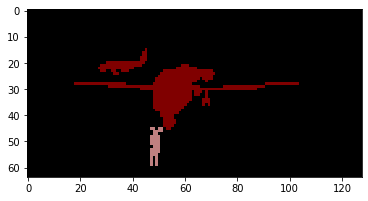

Target shape:  (64, 128)
Target stats:  0 15 0.14599609375
Img shape:  (64, 128, 3)
Img stats:  -0.92941177 1.0 -0.03459072


In [ ]:
img, target = trainset[0]
img = np.array(img).transpose(1,2,0)
target = np.array(target).squeeze()

plt.imshow((img + 1) / 2)
plt.show()
plt.imshow(target, interpolation='nearest', cmap=cmap_voc, norm=norm_voc)
plt.show()
print("Target shape: ", target.shape)
print("Target stats: ", target.min(), target.max(), target.mean())
print("Img shape: ", img.shape)
print("Img stats: ", img.min(), img.max(), img.mean())

# Model

*italicized text*#### Fully convolurional networks

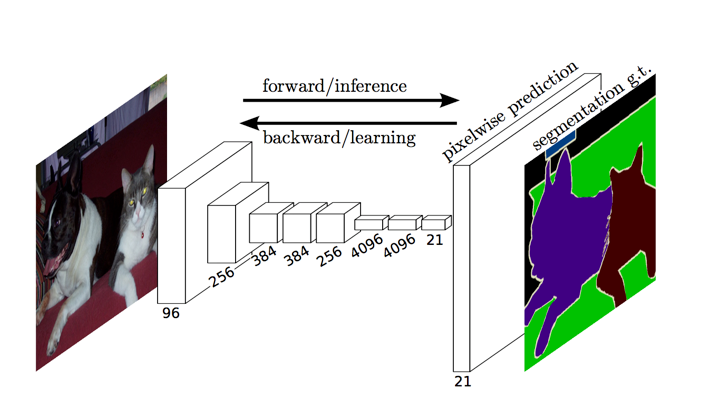

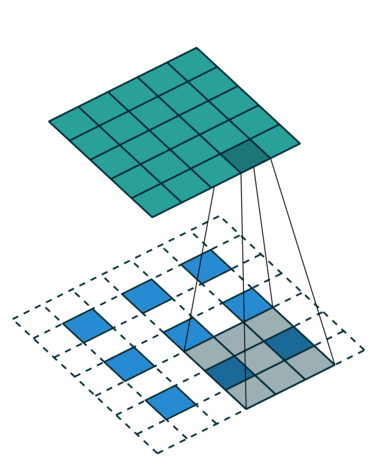

In [ ]:

class SegmModel2(nn.Module):
  def __init__(self):
    super(SegmModel2, self).__init__()
    
    self.conv1 = nn.Conv2d(3, 16, 5, padding=2, stride=2, bias=True)     
    self.conv2 = nn.Conv2d(16,32, 3, padding=1, stride=2, bias=True)
    self.conv3 = nn.Conv2d(32,64, 3, padding=1, stride=2, bias=True)
    self.conv4 = nn.Conv2d(64,128, 3, padding=1, stride=2, bias=True)

    self.up = nn.ConvTranspose2d(128, 128, 32, stride=16, padding=8, output_padding=0, bias=False)
    self.score = nn.Conv2d(128, 21, 1, bias=False)
    
  def forward(self, x):
    x = self.conv1(x)
    x = F.relu(x)

    x = self.conv2(x)
    x = F.relu(x)
    
    x = self.conv3(x)
    x = F.relu(x)
    
    x = self.conv4(x)
    x = F.relu(x)

    x = self.up(x)
    
    x = self.score(x)
    return x

### Train

In [ ]:
def plot_image_grid(img_data, pred_data, target, num=4):
  PAD = 8
  grid_data = torchvision.utils.make_grid(img_data[0:num, ...], normalize=True, padding=PAD, pad_value=1.0)
  grid_data = grid_data.numpy().transpose((1,2,0))
  
  grid_target = torchvision.utils.make_grid(target[0:num, ...].float(), normalize=False, padding=PAD, pad_value=255.0)
  grid_target = grid_target.numpy().transpose((1,2,0)).astype(np.int32)

  grid_pred = torchvision.utils.make_grid(pred_data[0:num, ...].float(), normalize=False, padding=PAD, pad_value=255.0)
  grid_pred = grid_pred.numpy().transpose((1,2,0)).astype(np.int32)
  
  fig, ax = plt.subplots(3,1)
  ax[0].imshow(grid_data)
  ax[1].imshow(grid_target[:,:,0], interpolation='nearest', cmap=cmap_voc, norm=norm_voc)
  ax[2].imshow(grid_pred[:,:,0], interpolation='nearest', cmap=cmap_voc, norm=norm_voc)
  
  plt.show()


def train(net, lr=1e-3, epochs=10, log_interval=10):
  optimizer = optim.Adam(net.parameters(), lr=lr) # optimizer definition
  criterion = nn.CrossEntropyLoss()

  losses = np.zeros(len(trainloader)*epochs)
  net.train() # put network in train mode

  for epoch in range(epochs):
    for batch_idx, (data, target) in enumerate(trainloader):
      data, target = data.to(device), target.to(device) # data loading
      optimizer.zero_grad() # set accumulated gradient to zero
      output = net(data) # forward step

      loss = criterion(output, target) # compute loss
      loss.backward() # backward step
      optimizer.step() # update step
      
      losses[len(trainloader)*epoch+batch_idx] = loss.item()
      
      if batch_idx % log_interval == 0:
        print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
        epoch, batch_idx * len(data), len(trainloader.dataset),
        100. * batch_idx / len(trainloader), loss.item()))
        
        pred = output.to(cpu).detach().max(1, keepdim=True)[1]
        target = target.to(cpu).unsqueeze(1)
        plot_image_grid(data.to(cpu), pred, target)
        

  losses = np.convolve(losses, np.ones((10,))/10, mode='full')
  plt.plot(losses)
  plt.grid()
  plt.title('Training loss')
  plt.show()

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cpu = torch.device("cpu")

In [ ]:
net3 = SegmModel2()
net3.to(device)

SegmModel2(
  (conv1): Conv2d(3, 16, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (up): ConvTranspose2d(128, 128, kernel_size=(32, 32), stride=(16, 16), padding=(8, 8), bias=False)
  (score): Conv2d(128, 21, kernel_size=(1, 1), stride=(1, 1), bias=False)
)

Train Epoch: 0 [0/1464 (0%)]	Loss: 3.044529


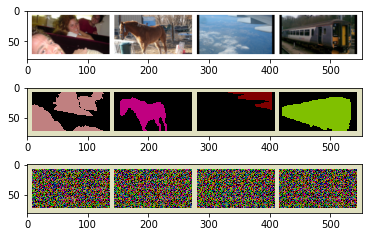

Train Epoch: 0 [640/1464 (43%)]	Loss: 1.919408


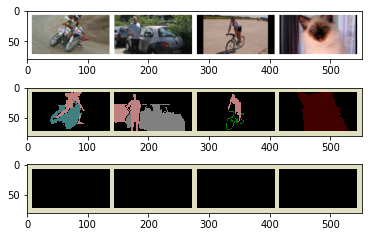

Train Epoch: 0 [1280/1464 (87%)]	Loss: 1.745499


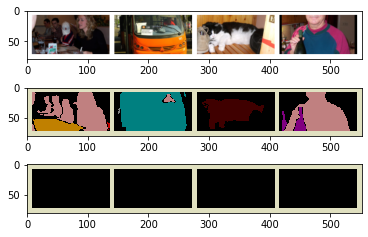

Train Epoch: 1 [0/1464 (0%)]	Loss: 1.767146


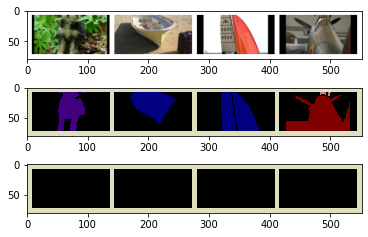

Train Epoch: 1 [640/1464 (43%)]	Loss: 1.697313


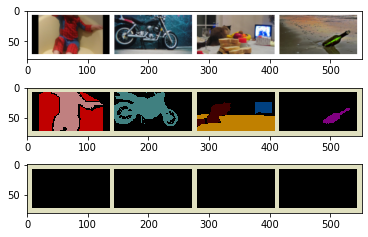

Train Epoch: 1 [1280/1464 (87%)]	Loss: 1.765122


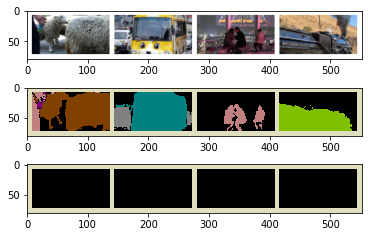

Train Epoch: 2 [0/1464 (0%)]	Loss: 1.685366


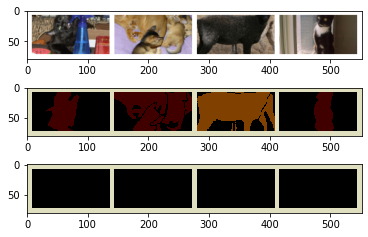

Train Epoch: 2 [640/1464 (43%)]	Loss: 1.439568


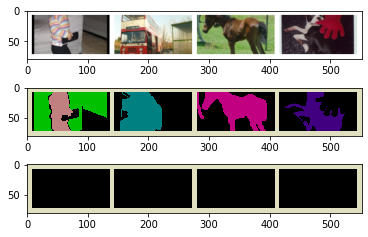

Train Epoch: 2 [1280/1464 (87%)]	Loss: 1.638121


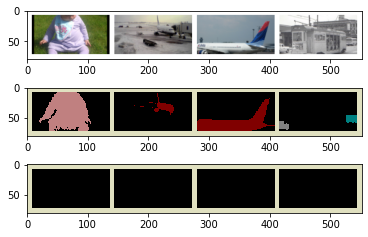

Train Epoch: 3 [0/1464 (0%)]	Loss: 1.490746


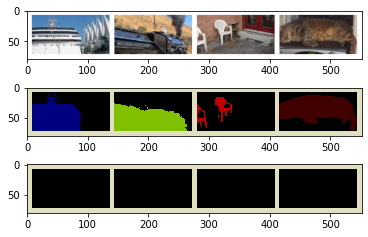

Train Epoch: 3 [640/1464 (43%)]	Loss: 1.714471


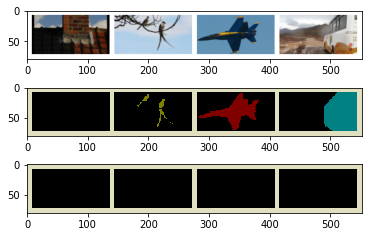

Train Epoch: 3 [1280/1464 (87%)]	Loss: 1.618062


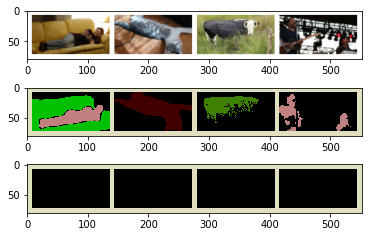

Train Epoch: 4 [0/1464 (0%)]	Loss: 1.454168


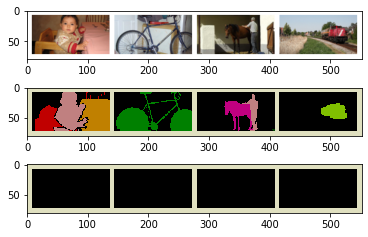

Train Epoch: 4 [640/1464 (43%)]	Loss: 1.699882


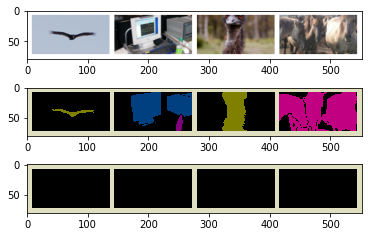

Train Epoch: 4 [1280/1464 (87%)]	Loss: 1.524480


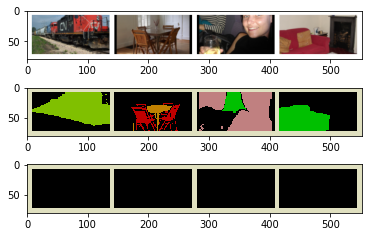

Train Epoch: 5 [0/1464 (0%)]	Loss: 1.157237


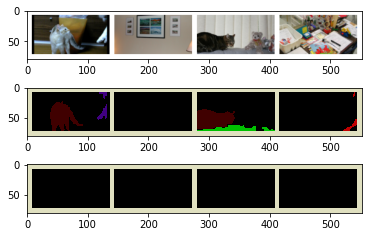

Train Epoch: 5 [640/1464 (43%)]	Loss: 1.368420


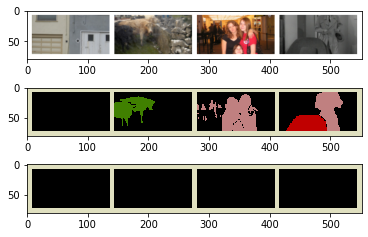

Train Epoch: 5 [1280/1464 (87%)]	Loss: 1.528277


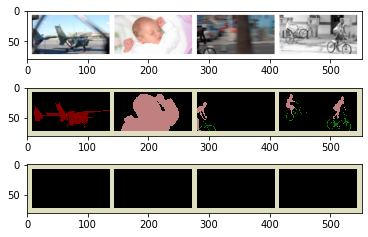

Train Epoch: 6 [0/1464 (0%)]	Loss: 1.380668


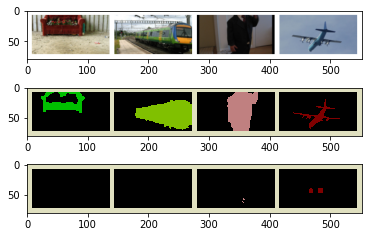

Train Epoch: 6 [640/1464 (43%)]	Loss: 1.840397


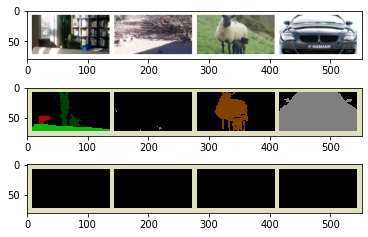

Train Epoch: 6 [1280/1464 (87%)]	Loss: 1.751057


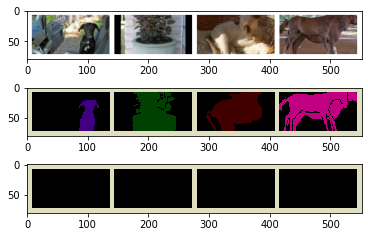

Train Epoch: 7 [0/1464 (0%)]	Loss: 1.308688


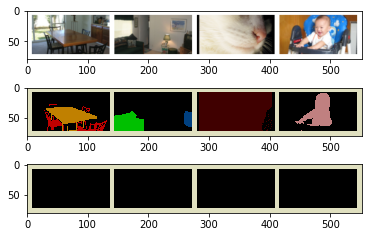

Train Epoch: 7 [640/1464 (43%)]	Loss: 1.740562


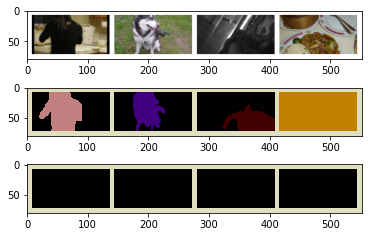

Train Epoch: 7 [1280/1464 (87%)]	Loss: 1.731931


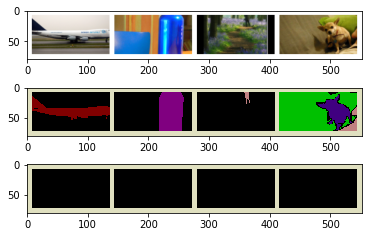

Train Epoch: 8 [0/1464 (0%)]	Loss: 1.611334


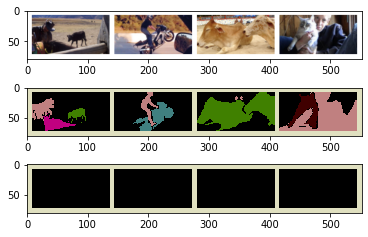

Train Epoch: 8 [640/1464 (43%)]	Loss: 1.578046


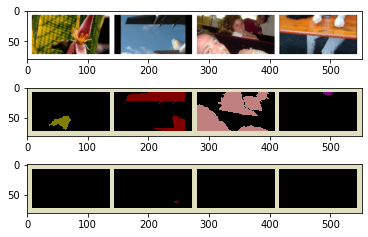

Train Epoch: 8 [1280/1464 (87%)]	Loss: 1.570890


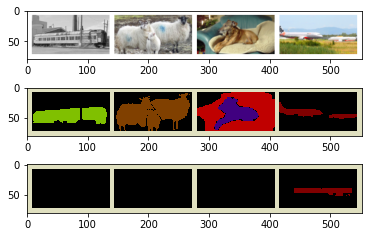

Train Epoch: 9 [0/1464 (0%)]	Loss: 1.418721


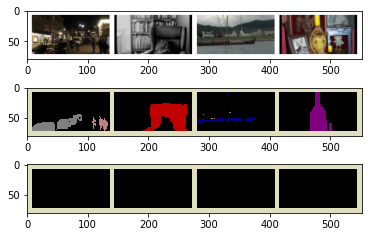

Train Epoch: 9 [640/1464 (43%)]	Loss: 1.572445


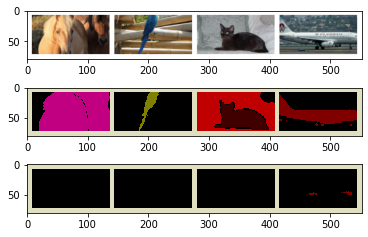

Train Epoch: 9 [1280/1464 (87%)]	Loss: 1.197749


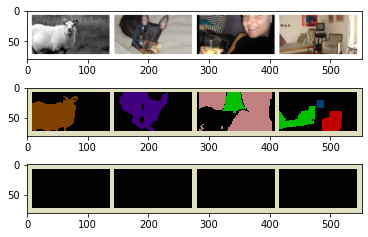

Train Epoch: 10 [0/1464 (0%)]	Loss: 1.197592


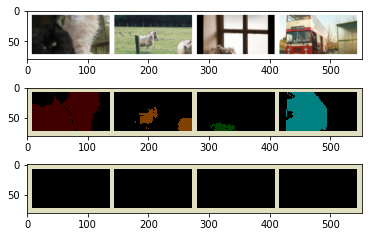

Train Epoch: 10 [640/1464 (43%)]	Loss: 1.172761


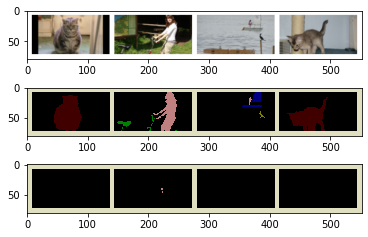

Train Epoch: 10 [1280/1464 (87%)]	Loss: 1.368100


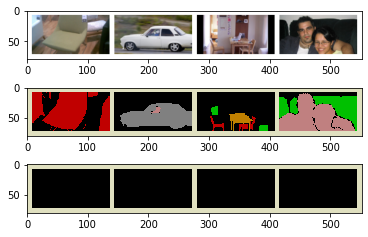

Train Epoch: 11 [0/1464 (0%)]	Loss: 1.397334


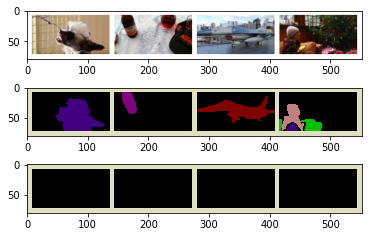

Train Epoch: 11 [640/1464 (43%)]	Loss: 1.463498


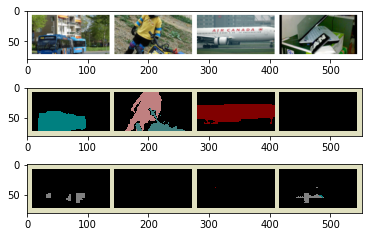

Train Epoch: 11 [1280/1464 (87%)]	Loss: 1.358426


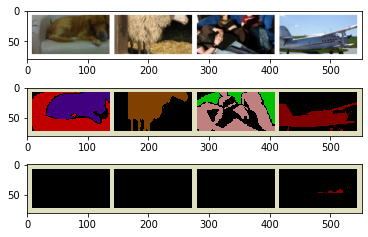

Train Epoch: 12 [0/1464 (0%)]	Loss: 1.598622


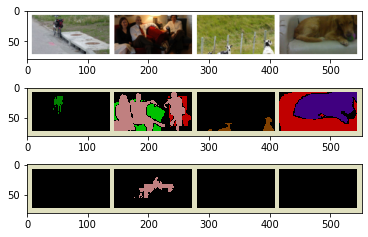

Train Epoch: 12 [640/1464 (43%)]	Loss: 1.235434


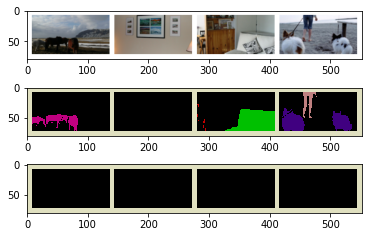

Train Epoch: 12 [1280/1464 (87%)]	Loss: 1.313102


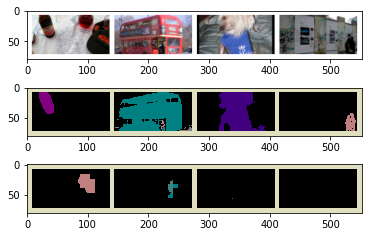

Train Epoch: 13 [0/1464 (0%)]	Loss: 1.476378


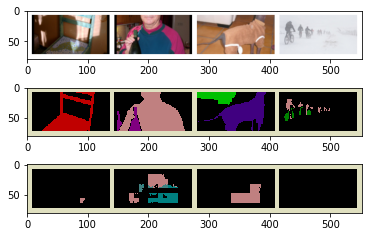

Train Epoch: 13 [640/1464 (43%)]	Loss: 1.416123


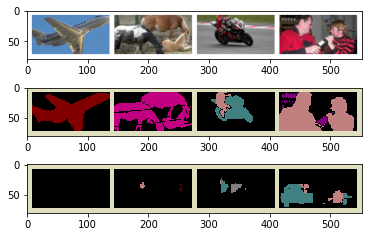

Train Epoch: 13 [1280/1464 (87%)]	Loss: 1.195467


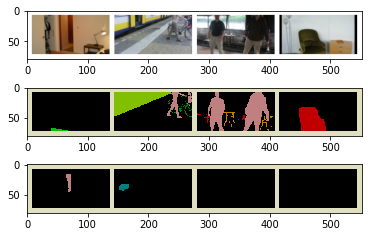

Train Epoch: 14 [0/1464 (0%)]	Loss: 1.175082


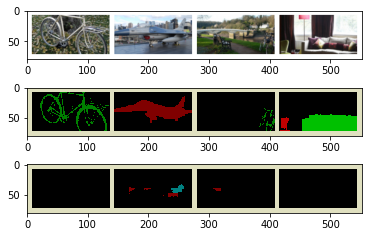

Train Epoch: 14 [640/1464 (43%)]	Loss: 1.370727


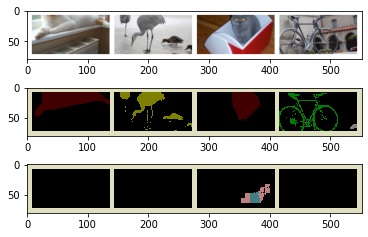

Train Epoch: 14 [1280/1464 (87%)]	Loss: 1.422029


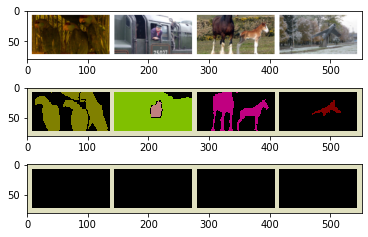

Train Epoch: 15 [0/1464 (0%)]	Loss: 1.316011


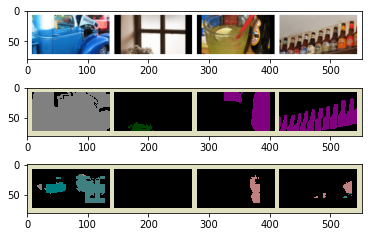

Train Epoch: 15 [640/1464 (43%)]	Loss: 1.539554


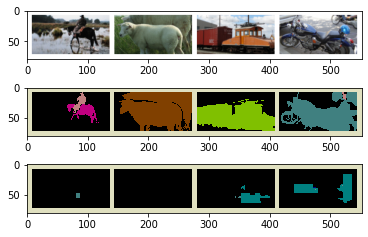

Train Epoch: 15 [1280/1464 (87%)]	Loss: 1.495557


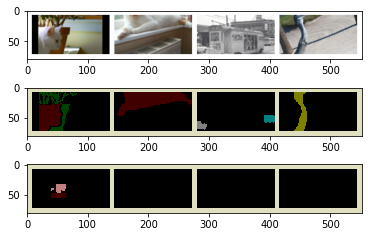

Train Epoch: 16 [0/1464 (0%)]	Loss: 1.461689


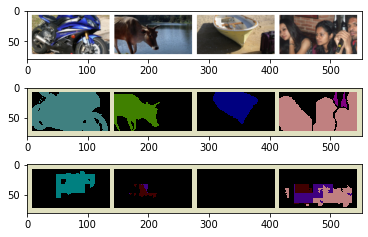

Train Epoch: 16 [640/1464 (43%)]	Loss: 1.434404


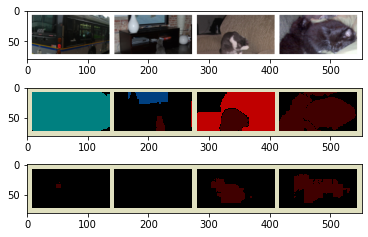

Train Epoch: 16 [1280/1464 (87%)]	Loss: 1.420492


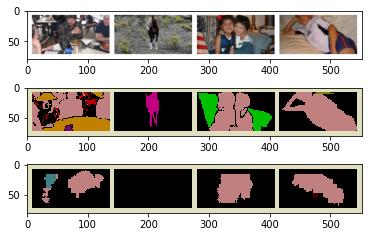

Train Epoch: 17 [0/1464 (0%)]	Loss: 1.189011


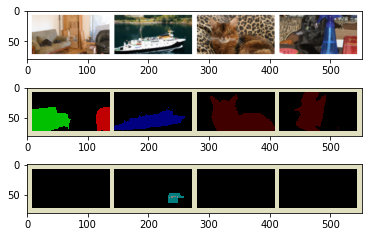

Train Epoch: 17 [640/1464 (43%)]	Loss: 1.211231


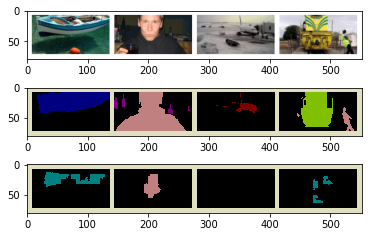

Train Epoch: 17 [1280/1464 (87%)]	Loss: 1.392776


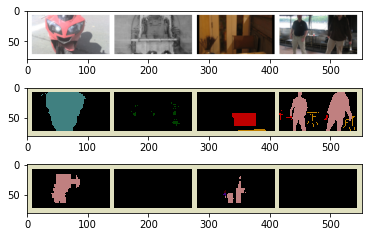

Train Epoch: 18 [0/1464 (0%)]	Loss: 1.350074


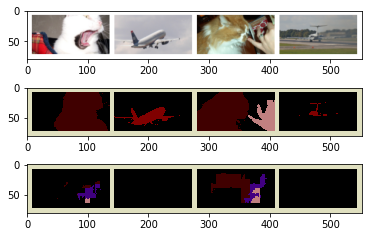

Train Epoch: 18 [640/1464 (43%)]	Loss: 1.463981


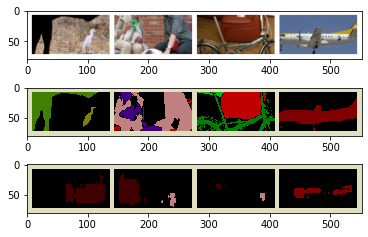

Train Epoch: 18 [1280/1464 (87%)]	Loss: 1.566872


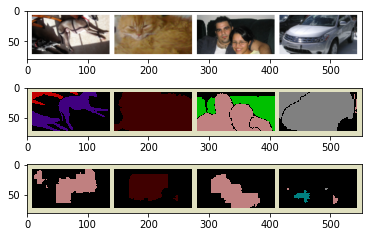

Train Epoch: 19 [0/1464 (0%)]	Loss: 1.587471


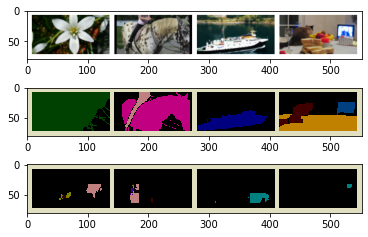

Train Epoch: 19 [640/1464 (43%)]	Loss: 1.319877


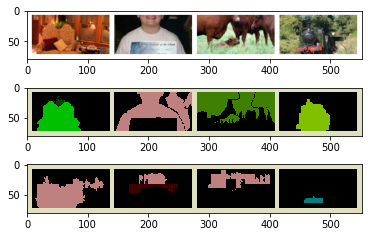

Train Epoch: 19 [1280/1464 (87%)]	Loss: 1.295464


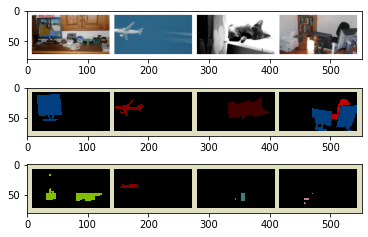

Train Epoch: 20 [0/1464 (0%)]	Loss: 1.361731


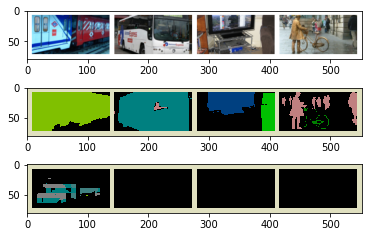

Train Epoch: 20 [640/1464 (43%)]	Loss: 1.287035


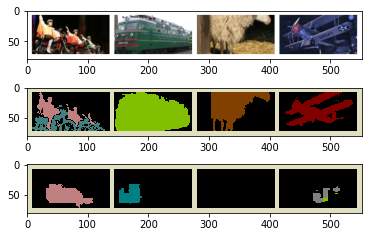

Train Epoch: 20 [1280/1464 (87%)]	Loss: 1.216999


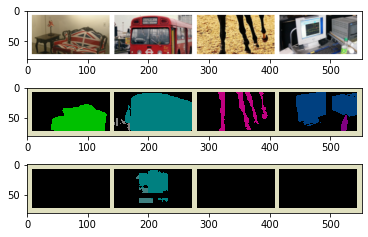

Train Epoch: 21 [0/1464 (0%)]	Loss: 1.457376


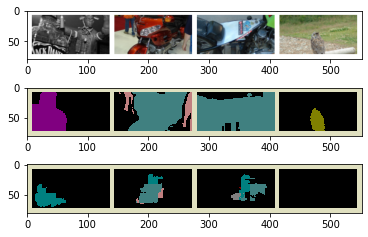

Train Epoch: 21 [640/1464 (43%)]	Loss: 1.402238


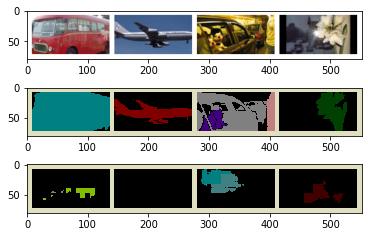

Train Epoch: 21 [1280/1464 (87%)]	Loss: 1.166011


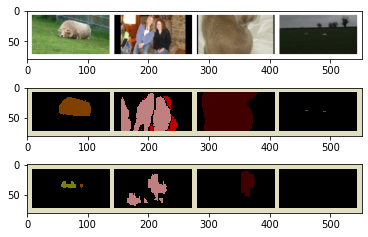

Train Epoch: 22 [0/1464 (0%)]	Loss: 1.413698


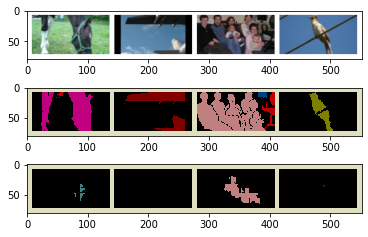

Train Epoch: 22 [640/1464 (43%)]	Loss: 1.059325


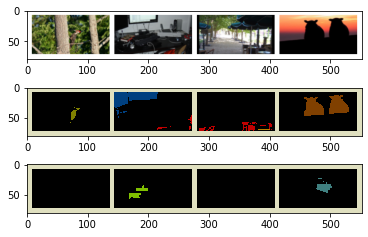

Train Epoch: 22 [1280/1464 (87%)]	Loss: 1.453299


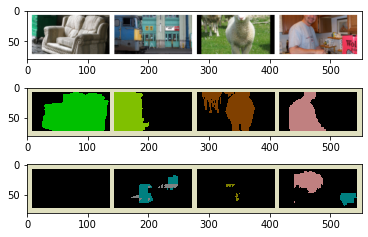

Train Epoch: 23 [0/1464 (0%)]	Loss: 1.174898


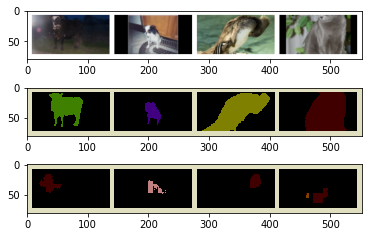

Train Epoch: 23 [640/1464 (43%)]	Loss: 1.246334


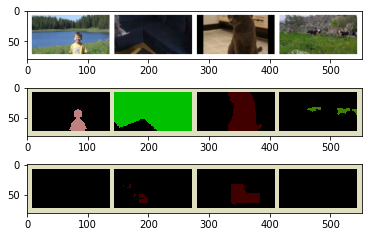

Train Epoch: 23 [1280/1464 (87%)]	Loss: 1.504662


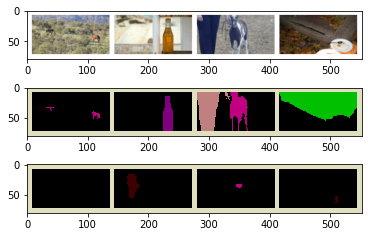

Train Epoch: 24 [0/1464 (0%)]	Loss: 1.061450


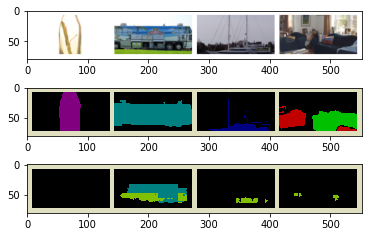

Train Epoch: 24 [640/1464 (43%)]	Loss: 1.034266


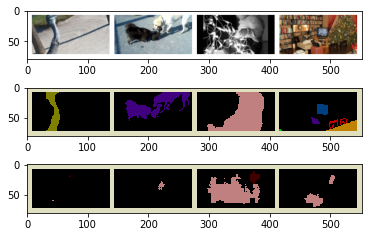

Train Epoch: 24 [1280/1464 (87%)]	Loss: 1.135059


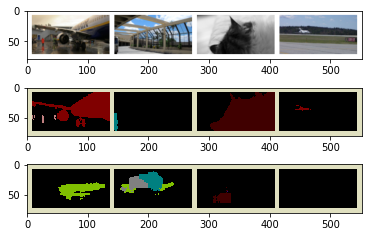

Train Epoch: 25 [0/1464 (0%)]	Loss: 1.280905


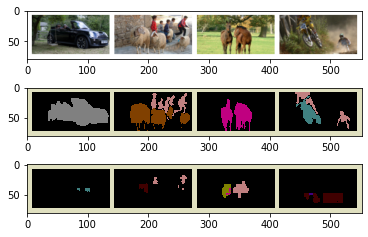

Train Epoch: 25 [640/1464 (43%)]	Loss: 1.255307


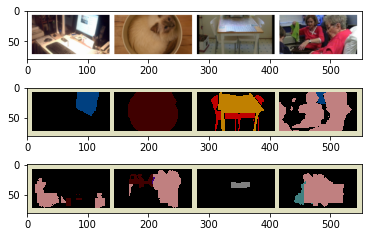

Train Epoch: 25 [1280/1464 (87%)]	Loss: 1.307041


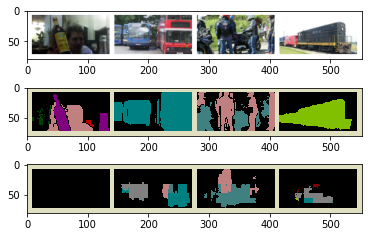

Train Epoch: 26 [0/1464 (0%)]	Loss: 1.249954


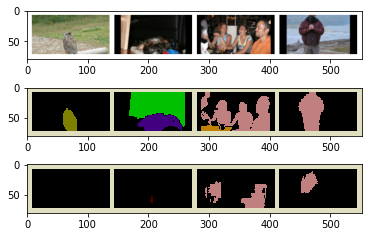

Train Epoch: 26 [640/1464 (43%)]	Loss: 1.326500


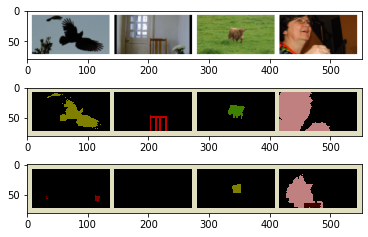

Train Epoch: 26 [1280/1464 (87%)]	Loss: 1.244195


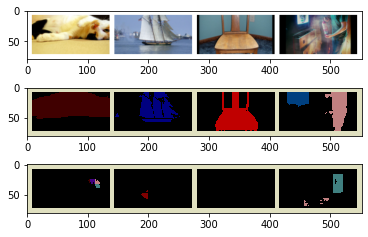

Train Epoch: 27 [0/1464 (0%)]	Loss: 1.446611


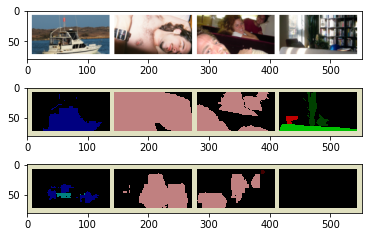

Train Epoch: 27 [640/1464 (43%)]	Loss: 1.182677


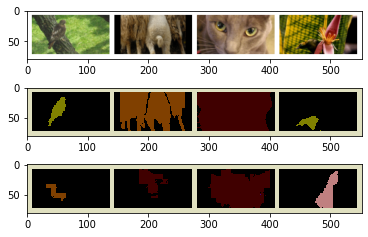

Train Epoch: 27 [1280/1464 (87%)]	Loss: 1.290263


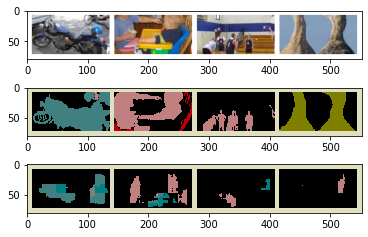

Train Epoch: 28 [0/1464 (0%)]	Loss: 1.231873


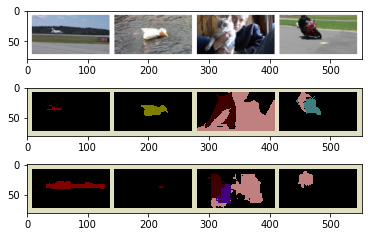

Train Epoch: 28 [640/1464 (43%)]	Loss: 1.325738


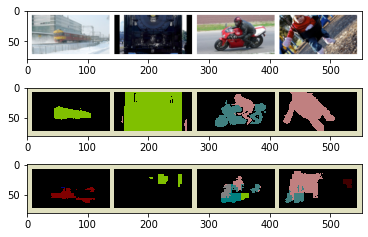

Train Epoch: 28 [1280/1464 (87%)]	Loss: 1.396127


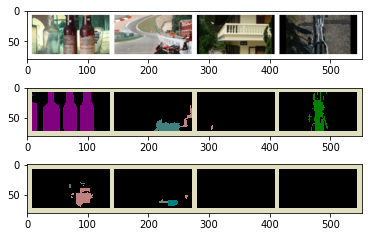

Train Epoch: 29 [0/1464 (0%)]	Loss: 1.353546


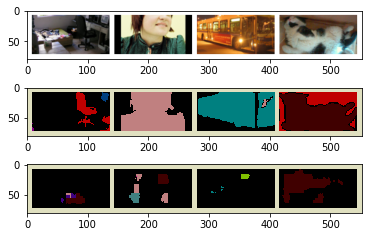

Train Epoch: 29 [640/1464 (43%)]	Loss: 1.204893


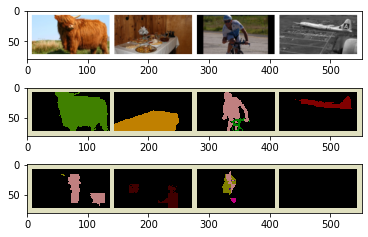

Train Epoch: 29 [1280/1464 (87%)]	Loss: 1.202594


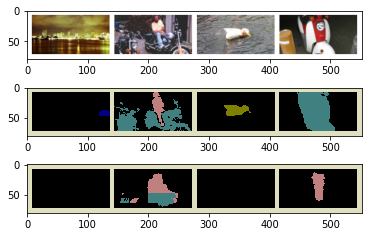

Train Epoch: 30 [0/1464 (0%)]	Loss: 1.302436


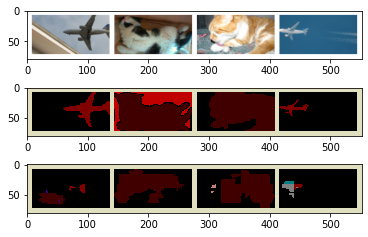

Train Epoch: 30 [640/1464 (43%)]	Loss: 1.180476


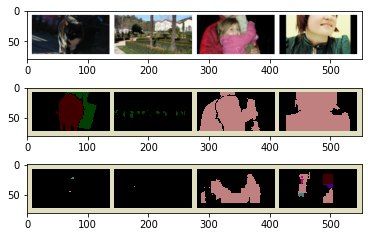

Train Epoch: 30 [1280/1464 (87%)]	Loss: 1.067357


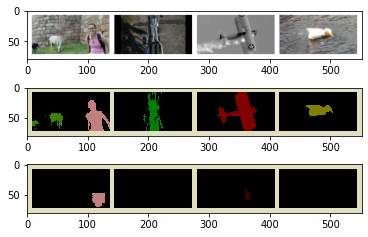

Train Epoch: 31 [0/1464 (0%)]	Loss: 1.400382


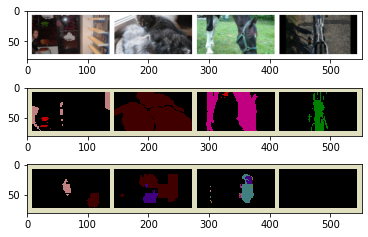

Train Epoch: 31 [640/1464 (43%)]	Loss: 1.231506


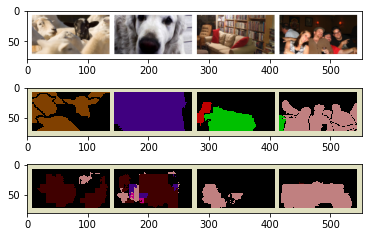

Train Epoch: 31 [1280/1464 (87%)]	Loss: 1.286473


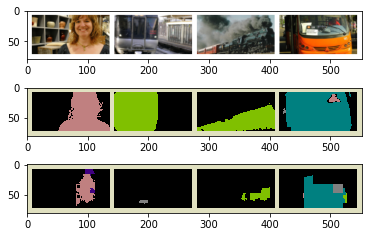

Train Epoch: 32 [0/1464 (0%)]	Loss: 1.049776


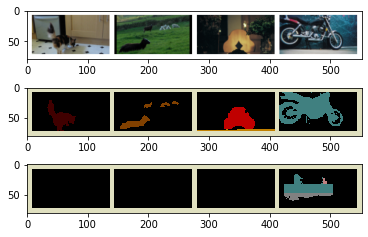

Train Epoch: 32 [640/1464 (43%)]	Loss: 1.173375


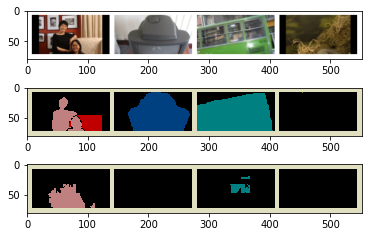

Train Epoch: 32 [1280/1464 (87%)]	Loss: 1.243950


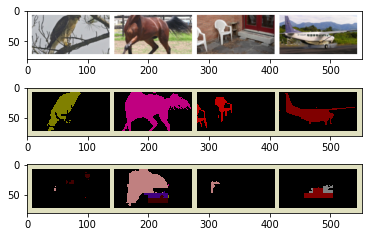

Train Epoch: 33 [0/1464 (0%)]	Loss: 1.099798


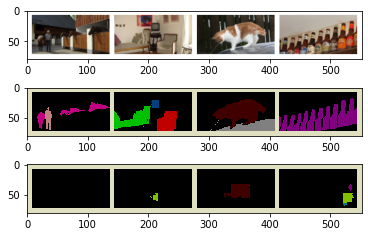

Train Epoch: 33 [640/1464 (43%)]	Loss: 1.129551


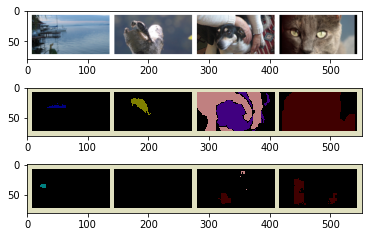

Train Epoch: 33 [1280/1464 (87%)]	Loss: 1.202521


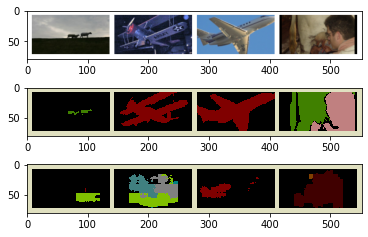

Train Epoch: 34 [0/1464 (0%)]	Loss: 1.189174


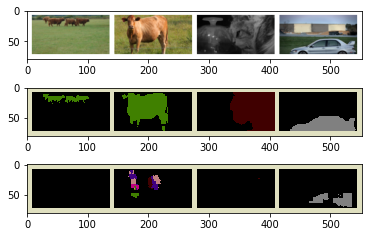

Train Epoch: 34 [640/1464 (43%)]	Loss: 1.427893


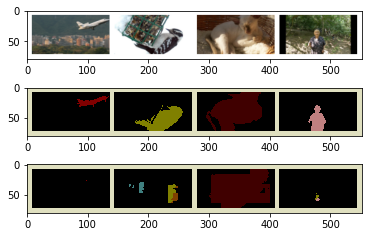

Train Epoch: 34 [1280/1464 (87%)]	Loss: 1.249082


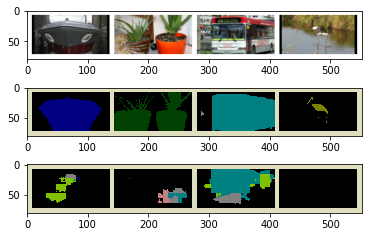

Train Epoch: 35 [0/1464 (0%)]	Loss: 1.285847


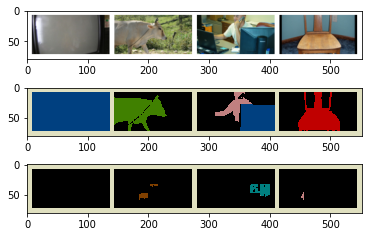

Train Epoch: 35 [640/1464 (43%)]	Loss: 1.110004


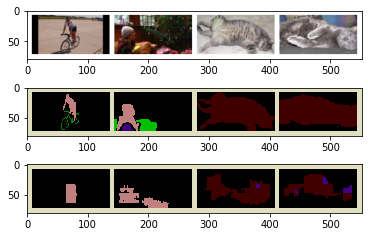

Train Epoch: 35 [1280/1464 (87%)]	Loss: 1.108642


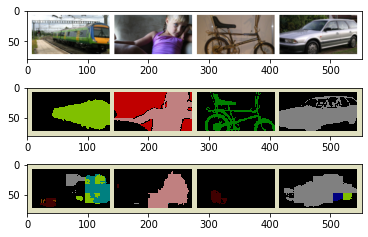

Train Epoch: 36 [0/1464 (0%)]	Loss: 1.133415


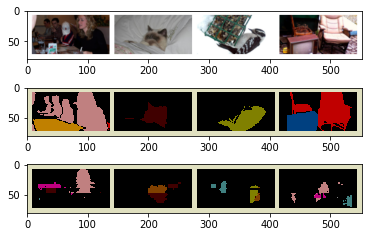

Train Epoch: 36 [640/1464 (43%)]	Loss: 1.142374


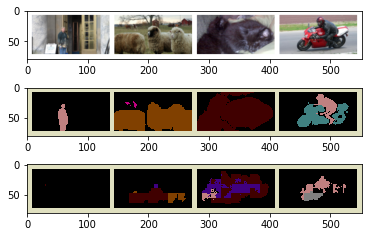

Train Epoch: 36 [1280/1464 (87%)]	Loss: 1.377811


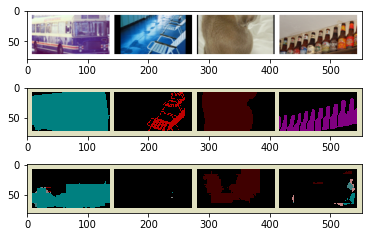

Train Epoch: 37 [0/1464 (0%)]	Loss: 1.444854


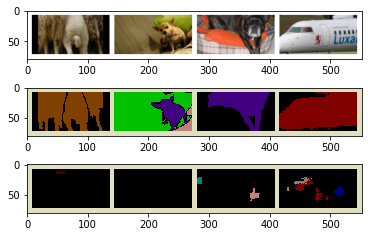

Train Epoch: 37 [640/1464 (43%)]	Loss: 1.005382


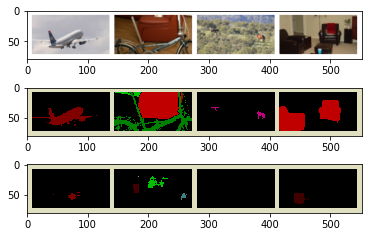

Train Epoch: 37 [1280/1464 (87%)]	Loss: 1.221390


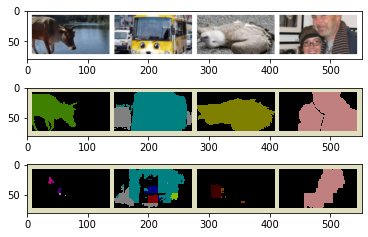

Train Epoch: 38 [0/1464 (0%)]	Loss: 1.022267


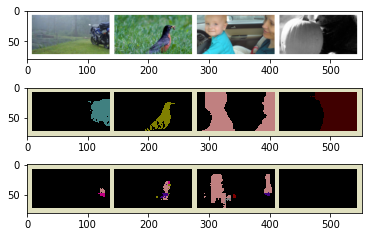

Train Epoch: 38 [640/1464 (43%)]	Loss: 1.054164


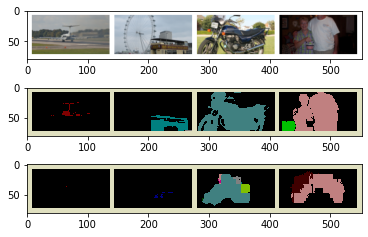

Train Epoch: 38 [1280/1464 (87%)]	Loss: 1.116927


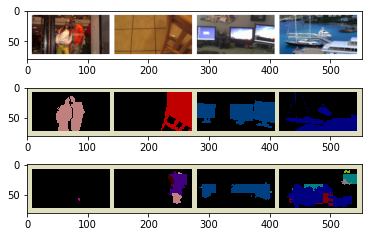

Train Epoch: 39 [0/1464 (0%)]	Loss: 1.145357


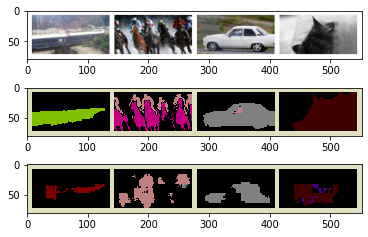

Train Epoch: 39 [640/1464 (43%)]	Loss: 1.041986


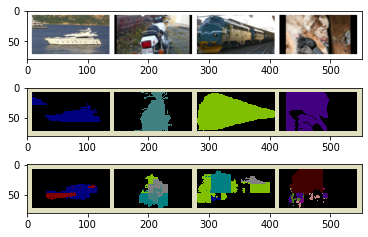

Train Epoch: 39 [1280/1464 (87%)]	Loss: 1.155753


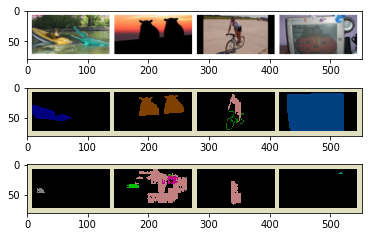

Train Epoch: 40 [0/1464 (0%)]	Loss: 0.990088


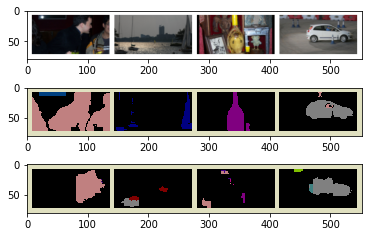

Train Epoch: 40 [640/1464 (43%)]	Loss: 0.944156


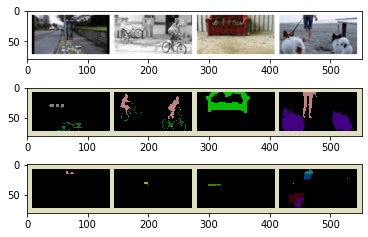

Train Epoch: 40 [1280/1464 (87%)]	Loss: 1.113453


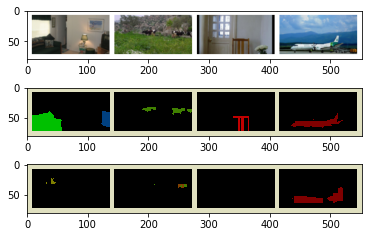

Train Epoch: 41 [0/1464 (0%)]	Loss: 0.995654


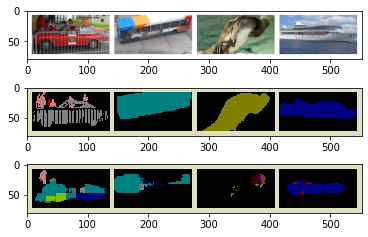

Train Epoch: 41 [640/1464 (43%)]	Loss: 1.090159


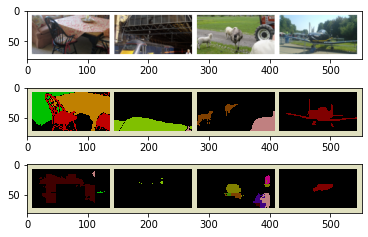

Train Epoch: 41 [1280/1464 (87%)]	Loss: 1.098780


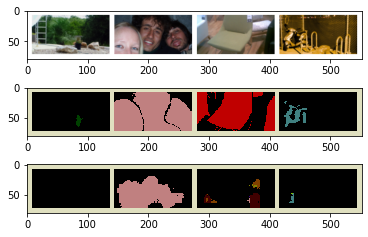

Train Epoch: 42 [0/1464 (0%)]	Loss: 1.020383


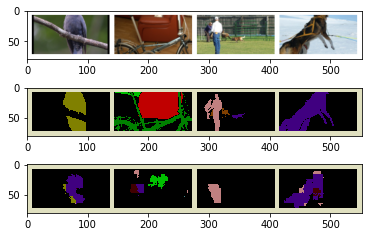

Train Epoch: 42 [640/1464 (43%)]	Loss: 1.358392


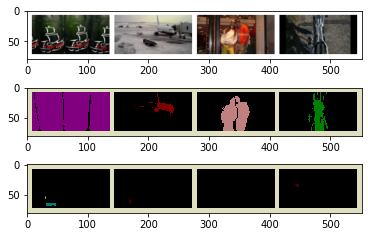

Train Epoch: 42 [1280/1464 (87%)]	Loss: 0.974012


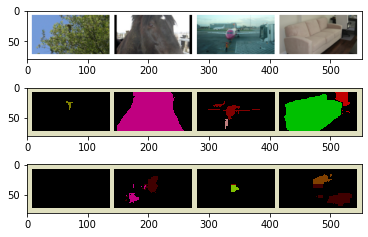

Train Epoch: 43 [0/1464 (0%)]	Loss: 1.094561


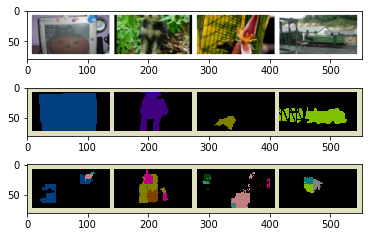

Train Epoch: 43 [640/1464 (43%)]	Loss: 1.106076


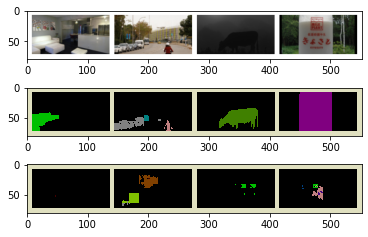

Train Epoch: 43 [1280/1464 (87%)]	Loss: 1.137758


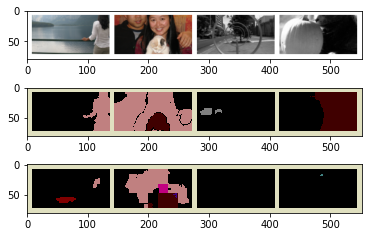

Train Epoch: 44 [0/1464 (0%)]	Loss: 1.020564


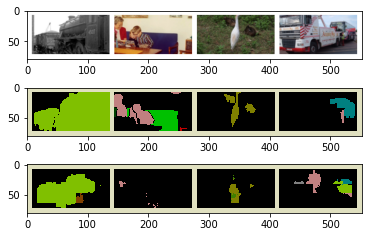

Train Epoch: 44 [640/1464 (43%)]	Loss: 1.008054


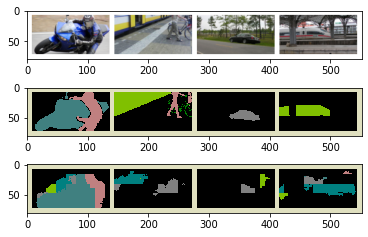

Train Epoch: 44 [1280/1464 (87%)]	Loss: 1.041897


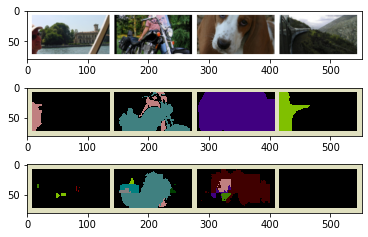

Train Epoch: 45 [0/1464 (0%)]	Loss: 0.953984


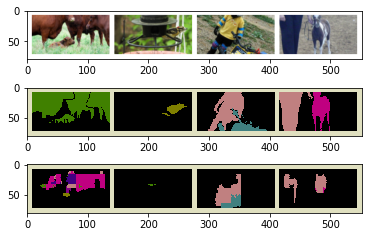

Train Epoch: 45 [640/1464 (43%)]	Loss: 0.920949


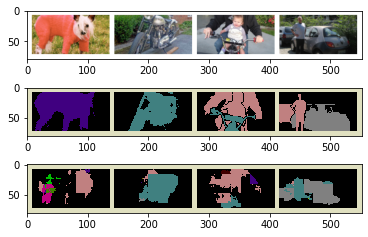

Train Epoch: 45 [1280/1464 (87%)]	Loss: 0.929253


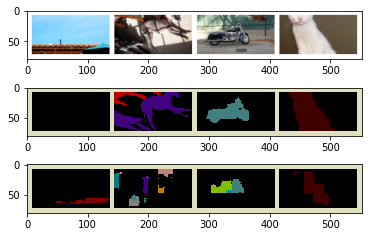

Train Epoch: 46 [0/1464 (0%)]	Loss: 0.763284


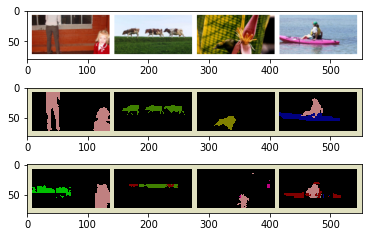

Train Epoch: 46 [640/1464 (43%)]	Loss: 0.948253


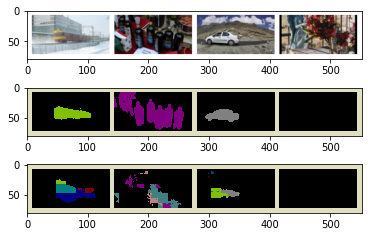

Train Epoch: 46 [1280/1464 (87%)]	Loss: 0.910189


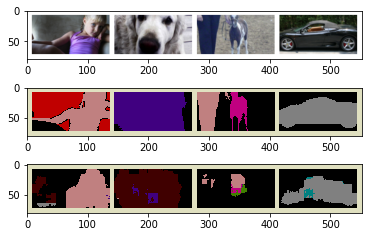

Train Epoch: 47 [0/1464 (0%)]	Loss: 0.996561


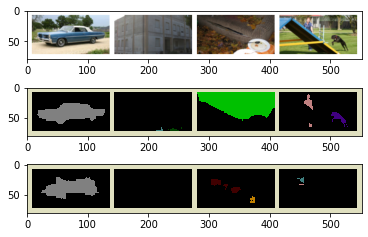

Train Epoch: 47 [640/1464 (43%)]	Loss: 0.977933


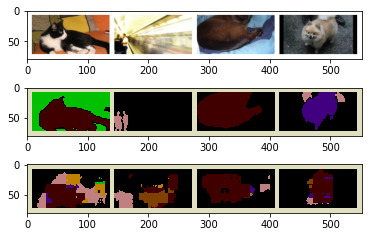

Train Epoch: 47 [1280/1464 (87%)]	Loss: 0.820955


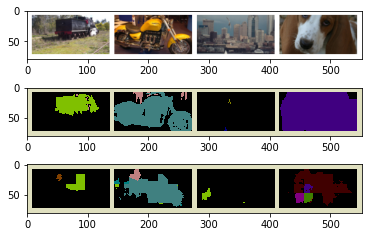

Train Epoch: 48 [0/1464 (0%)]	Loss: 0.902587


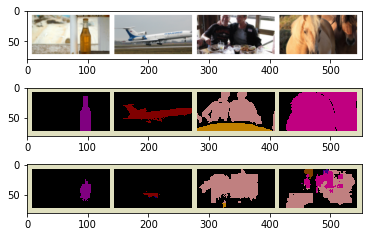

Train Epoch: 48 [640/1464 (43%)]	Loss: 1.097013


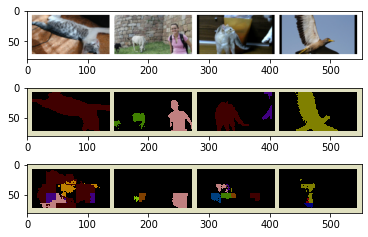

Train Epoch: 48 [1280/1464 (87%)]	Loss: 0.973632


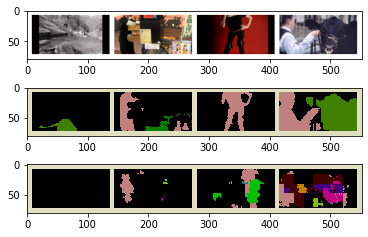

Train Epoch: 49 [0/1464 (0%)]	Loss: 0.886272


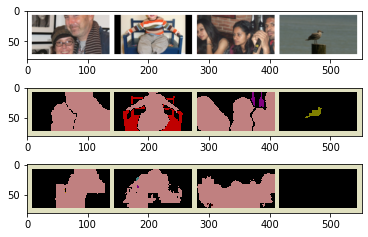

Train Epoch: 49 [640/1464 (43%)]	Loss: 0.933678


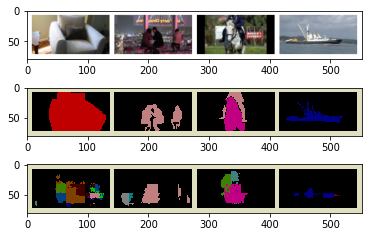

Train Epoch: 49 [1280/1464 (87%)]	Loss: 0.767795


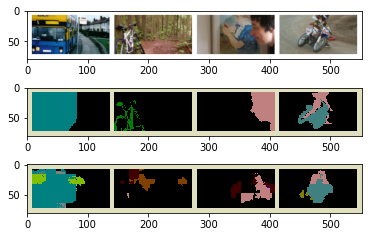

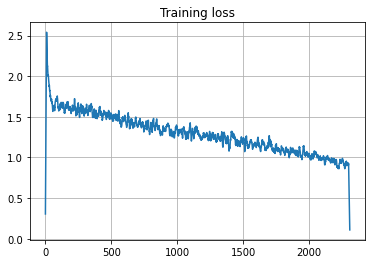

In [ ]:
train(net3, lr=1e-3, epochs=50, log_interval=20)

Train Epoch: 0 [0/1464 (0%)]	Loss: 0.797448


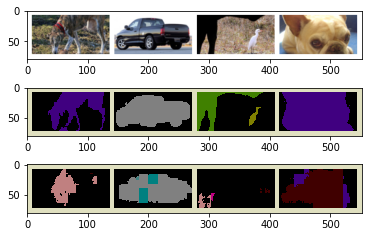

Train Epoch: 0 [640/1464 (43%)]	Loss: 0.987484


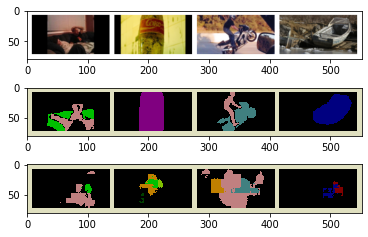

Train Epoch: 0 [1280/1464 (87%)]	Loss: 0.725901


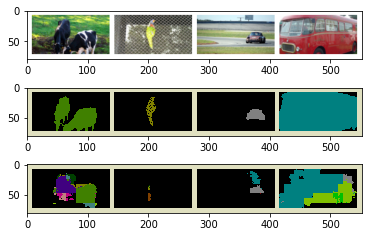

Train Epoch: 1 [0/1464 (0%)]	Loss: 0.882647


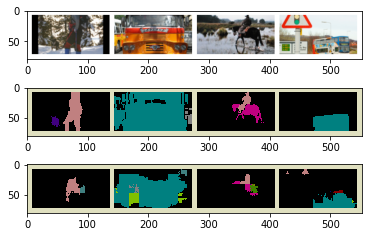

Train Epoch: 1 [640/1464 (43%)]	Loss: 1.008762


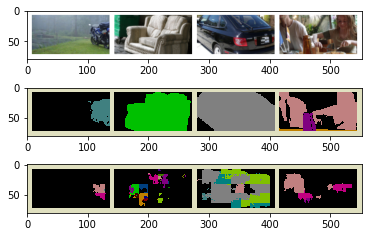

Train Epoch: 1 [1280/1464 (87%)]	Loss: 0.731557


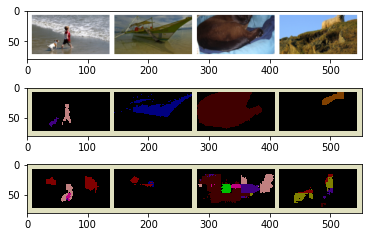

Train Epoch: 2 [0/1464 (0%)]	Loss: 1.033841


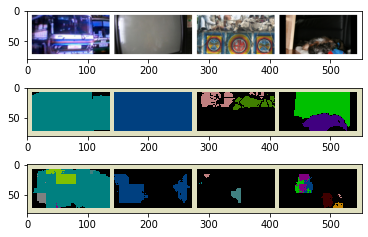

Train Epoch: 2 [640/1464 (43%)]	Loss: 0.851482


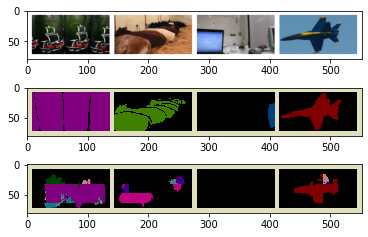

Train Epoch: 2 [1280/1464 (87%)]	Loss: 0.987294


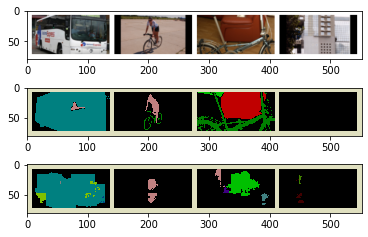

Train Epoch: 3 [0/1464 (0%)]	Loss: 0.754511


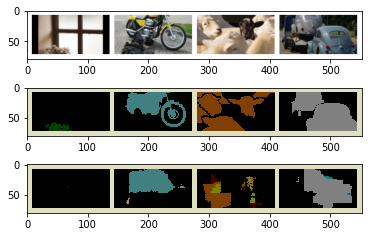

Train Epoch: 3 [640/1464 (43%)]	Loss: 0.890063


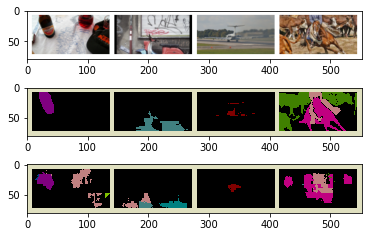

Train Epoch: 3 [1280/1464 (87%)]	Loss: 1.015157


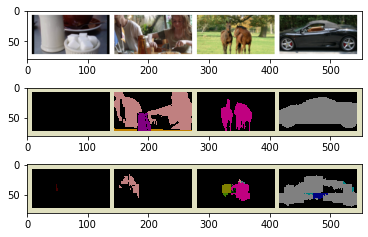

Train Epoch: 4 [0/1464 (0%)]	Loss: 0.901846


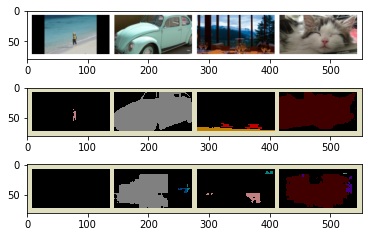

Train Epoch: 4 [640/1464 (43%)]	Loss: 1.077165


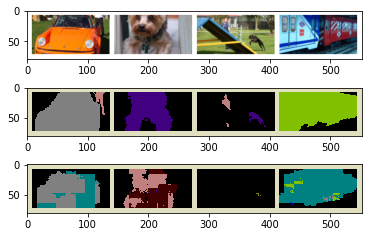

Train Epoch: 4 [1280/1464 (87%)]	Loss: 0.861144


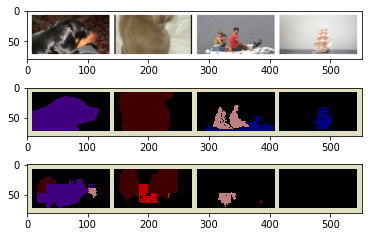

Train Epoch: 5 [0/1464 (0%)]	Loss: 0.809158


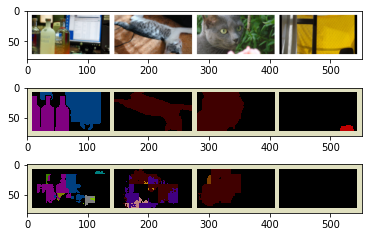

Train Epoch: 5 [640/1464 (43%)]	Loss: 0.913562


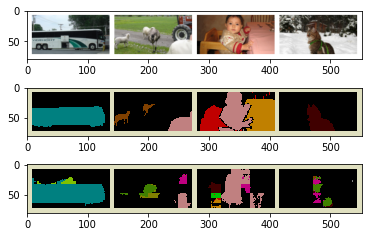

Train Epoch: 5 [1280/1464 (87%)]	Loss: 0.828007


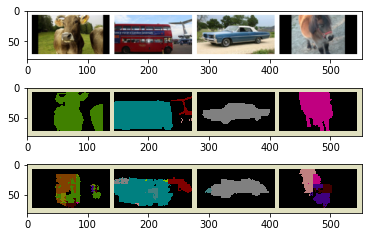

Train Epoch: 6 [0/1464 (0%)]	Loss: 0.808216


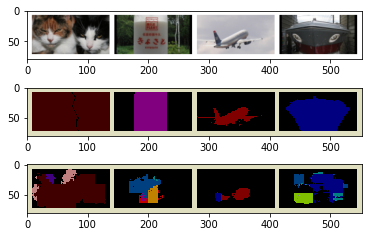

Train Epoch: 6 [640/1464 (43%)]	Loss: 0.789309


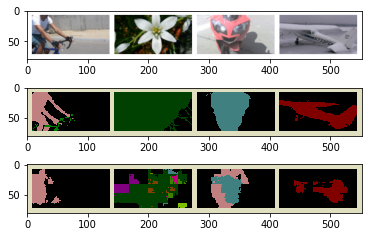

Train Epoch: 6 [1280/1464 (87%)]	Loss: 0.843474


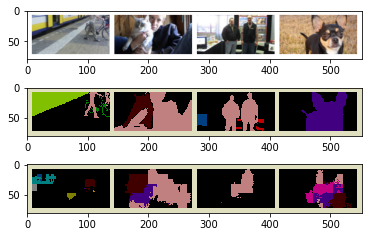

Train Epoch: 7 [0/1464 (0%)]	Loss: 0.906375


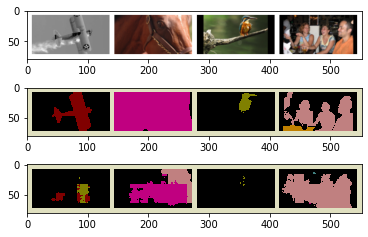

Train Epoch: 7 [640/1464 (43%)]	Loss: 0.954805


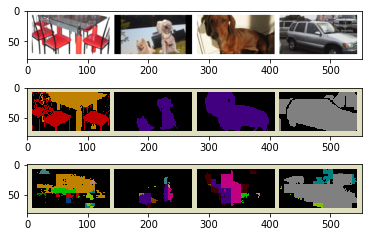

Train Epoch: 7 [1280/1464 (87%)]	Loss: 0.824364


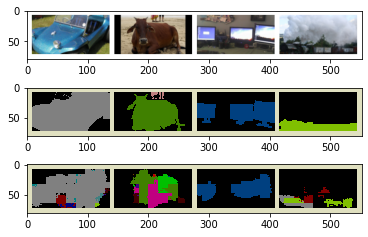

Train Epoch: 8 [0/1464 (0%)]	Loss: 0.703828


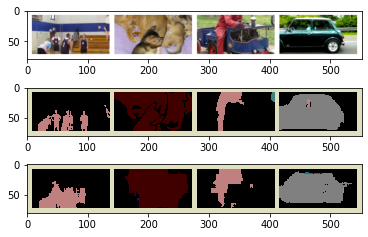

Train Epoch: 8 [640/1464 (43%)]	Loss: 0.717997


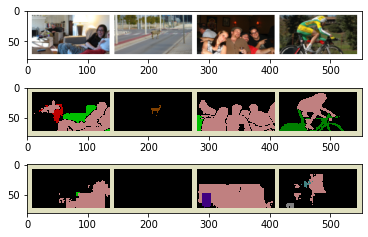

Train Epoch: 8 [1280/1464 (87%)]	Loss: 0.844553


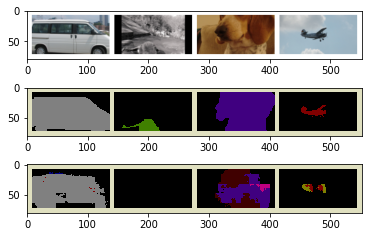

Train Epoch: 9 [0/1464 (0%)]	Loss: 0.575093


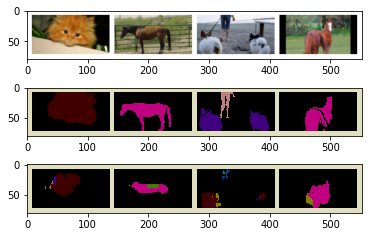

Train Epoch: 9 [640/1464 (43%)]	Loss: 0.786673


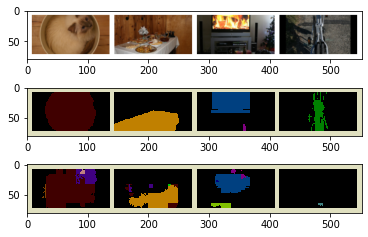

Train Epoch: 9 [1280/1464 (87%)]	Loss: 0.683551


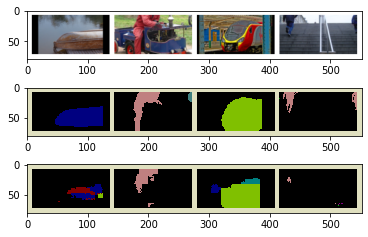

Train Epoch: 10 [0/1464 (0%)]	Loss: 0.701524


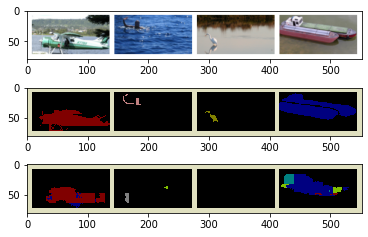

Train Epoch: 10 [640/1464 (43%)]	Loss: 0.698852


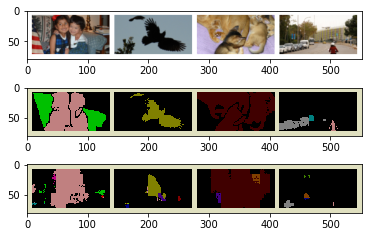

Train Epoch: 10 [1280/1464 (87%)]	Loss: 0.771691


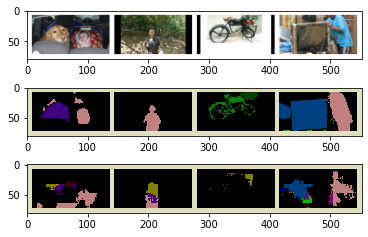

Train Epoch: 11 [0/1464 (0%)]	Loss: 0.551112


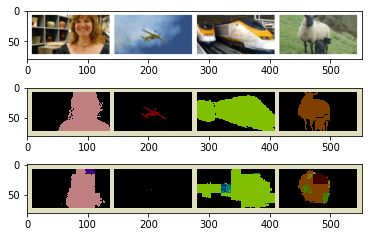

Train Epoch: 11 [640/1464 (43%)]	Loss: 0.790690


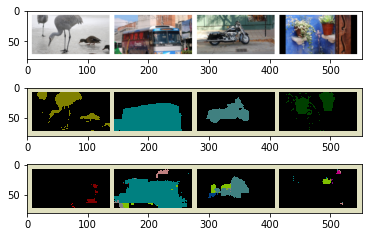

Train Epoch: 11 [1280/1464 (87%)]	Loss: 0.672075


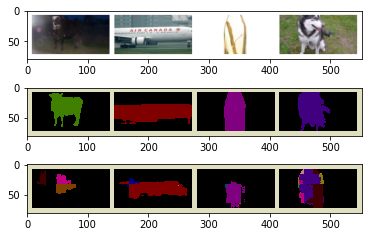

Train Epoch: 12 [0/1464 (0%)]	Loss: 0.629013


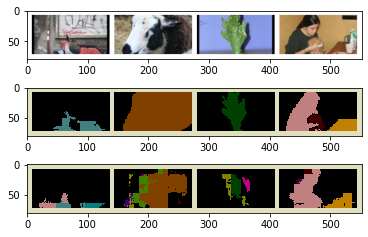

Train Epoch: 12 [640/1464 (43%)]	Loss: 0.730764


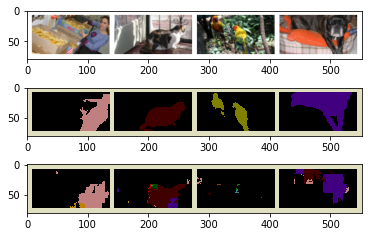

Train Epoch: 12 [1280/1464 (87%)]	Loss: 0.689448


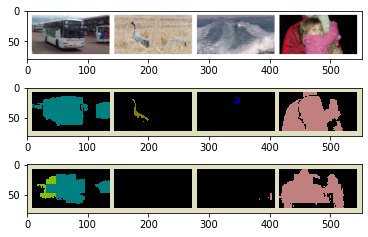

Train Epoch: 13 [0/1464 (0%)]	Loss: 0.689309


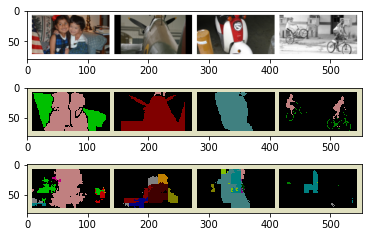

Train Epoch: 13 [640/1464 (43%)]	Loss: 0.638641


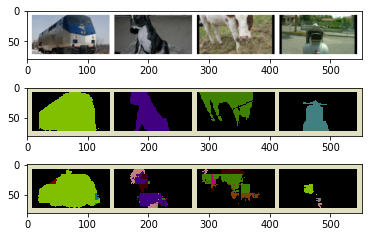

Train Epoch: 13 [1280/1464 (87%)]	Loss: 0.597548


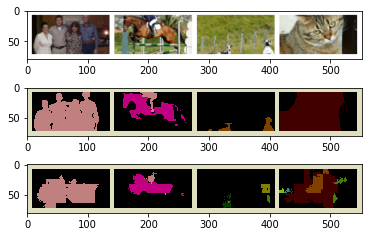

Train Epoch: 14 [0/1464 (0%)]	Loss: 0.535310


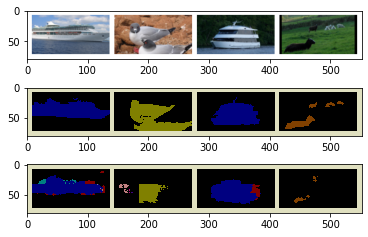

Train Epoch: 14 [640/1464 (43%)]	Loss: 0.716651


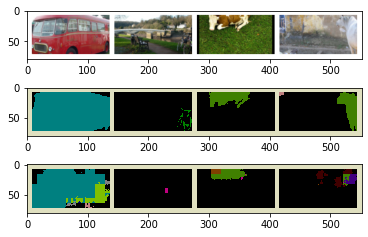

Train Epoch: 14 [1280/1464 (87%)]	Loss: 0.716648


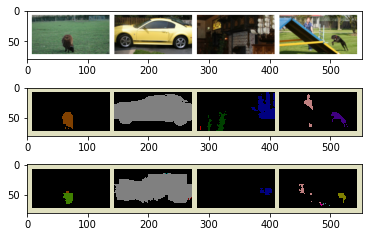

Train Epoch: 15 [0/1464 (0%)]	Loss: 0.593690


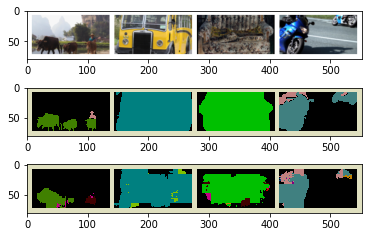

Train Epoch: 15 [640/1464 (43%)]	Loss: 0.637694


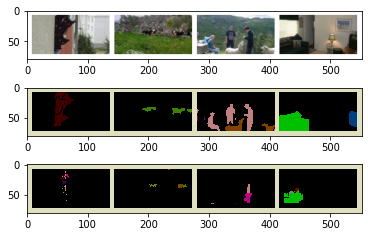

Train Epoch: 15 [1280/1464 (87%)]	Loss: 0.762978


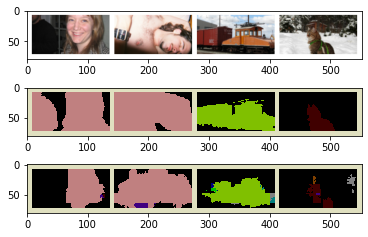

Train Epoch: 16 [0/1464 (0%)]	Loss: 0.699025


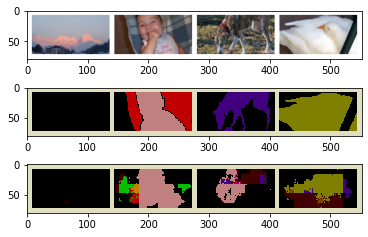

Train Epoch: 16 [640/1464 (43%)]	Loss: 0.552334


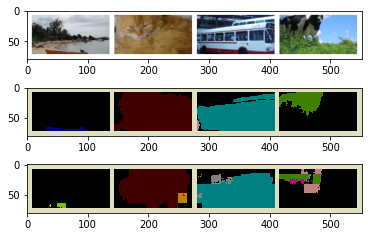

Train Epoch: 16 [1280/1464 (87%)]	Loss: 0.688580


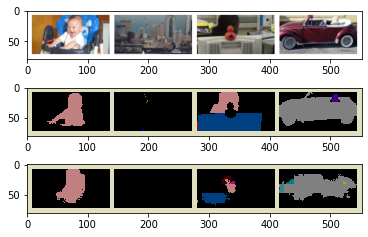

Train Epoch: 17 [0/1464 (0%)]	Loss: 0.577762


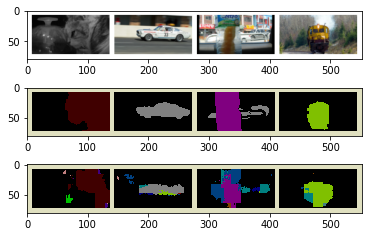

Train Epoch: 17 [640/1464 (43%)]	Loss: 0.570478


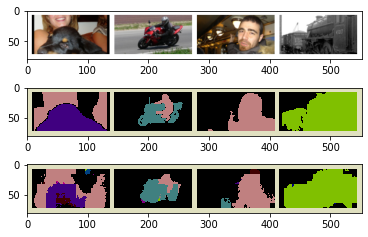

Train Epoch: 17 [1280/1464 (87%)]	Loss: 0.730963


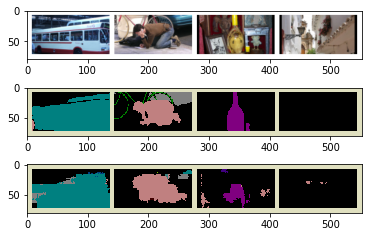

Train Epoch: 18 [0/1464 (0%)]	Loss: 0.564464


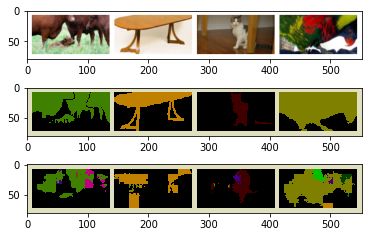

Train Epoch: 18 [640/1464 (43%)]	Loss: 0.649704


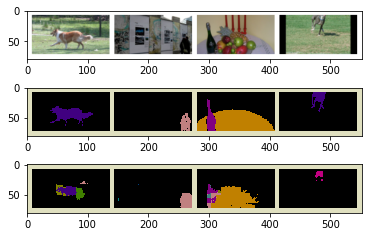

Train Epoch: 18 [1280/1464 (87%)]	Loss: 0.614903


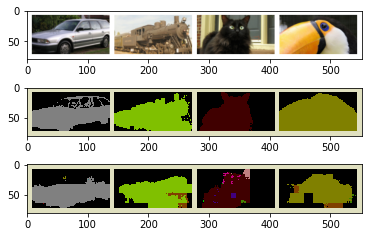

Train Epoch: 19 [0/1464 (0%)]	Loss: 0.616372


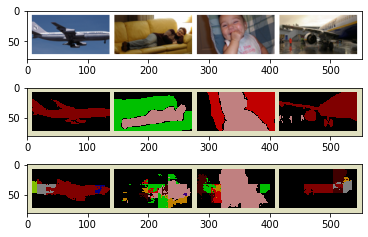

Train Epoch: 19 [640/1464 (43%)]	Loss: 0.619078


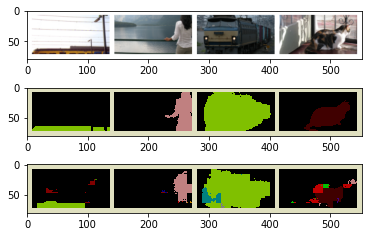

Train Epoch: 19 [1280/1464 (87%)]	Loss: 0.644904


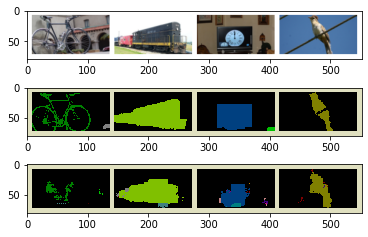

Train Epoch: 20 [0/1464 (0%)]	Loss: 0.587438


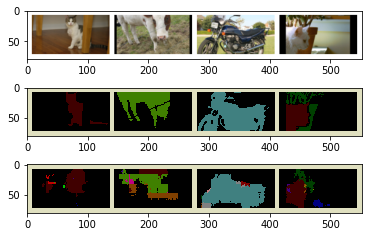

Train Epoch: 20 [640/1464 (43%)]	Loss: 0.553765


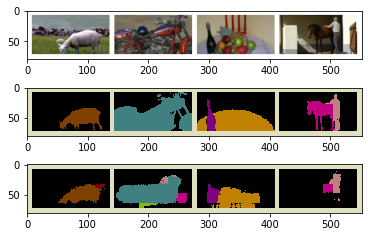

Train Epoch: 20 [1280/1464 (87%)]	Loss: 0.689768


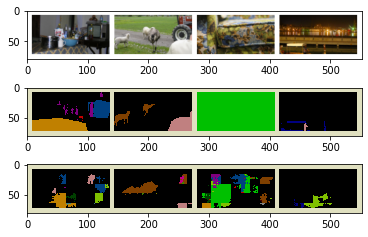

Train Epoch: 21 [0/1464 (0%)]	Loss: 0.508453


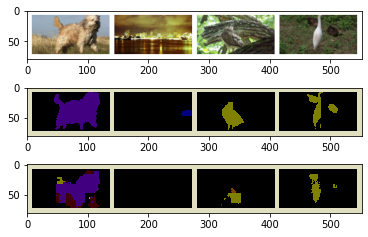

Train Epoch: 21 [640/1464 (43%)]	Loss: 0.577388


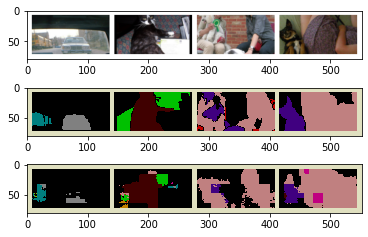

Train Epoch: 21 [1280/1464 (87%)]	Loss: 0.652390


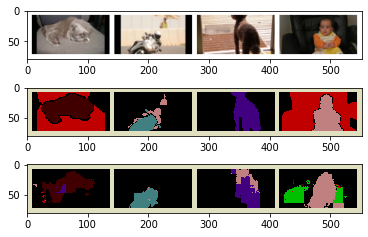

Train Epoch: 22 [0/1464 (0%)]	Loss: 0.540598


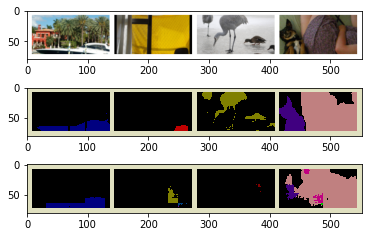

Train Epoch: 22 [640/1464 (43%)]	Loss: 0.633215


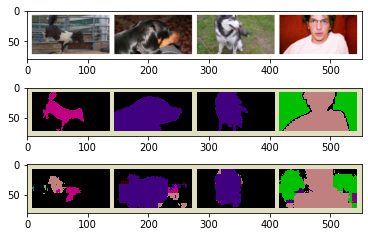

Train Epoch: 22 [1280/1464 (87%)]	Loss: 0.599808


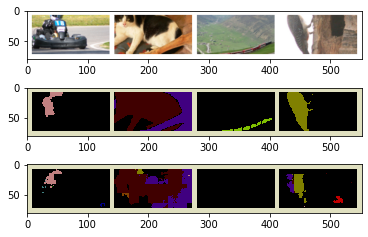

Train Epoch: 23 [0/1464 (0%)]	Loss: 0.668588


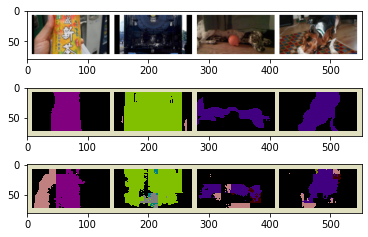

Train Epoch: 23 [640/1464 (43%)]	Loss: 0.550307


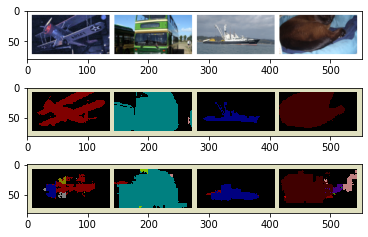

Train Epoch: 23 [1280/1464 (87%)]	Loss: 0.569848


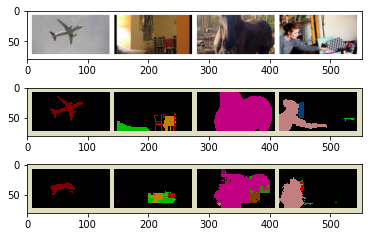

Train Epoch: 24 [0/1464 (0%)]	Loss: 0.611246


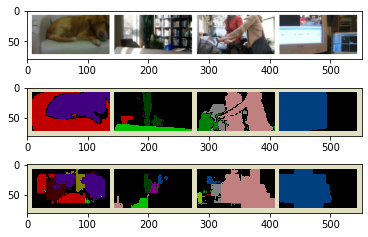

Train Epoch: 24 [640/1464 (43%)]	Loss: 0.461179


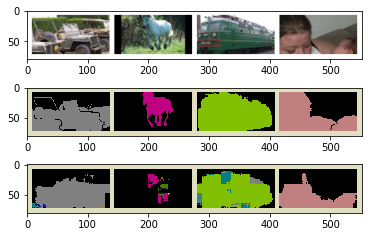

Train Epoch: 24 [1280/1464 (87%)]	Loss: 0.452414


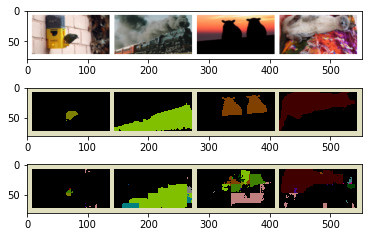

Train Epoch: 25 [0/1464 (0%)]	Loss: 0.526419


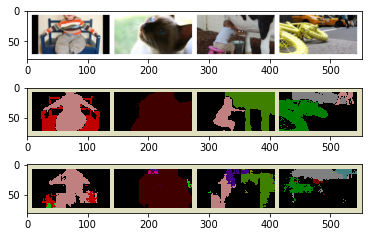

Train Epoch: 25 [640/1464 (43%)]	Loss: 0.551756


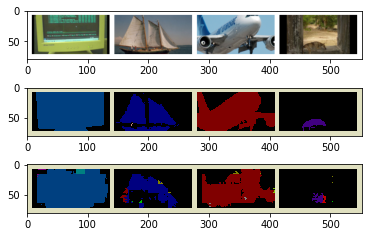

Train Epoch: 25 [1280/1464 (87%)]	Loss: 0.503986


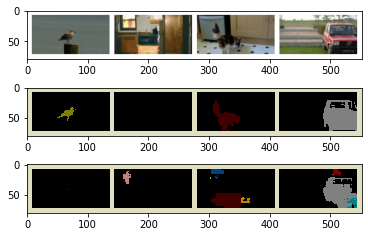

Train Epoch: 26 [0/1464 (0%)]	Loss: 0.459473


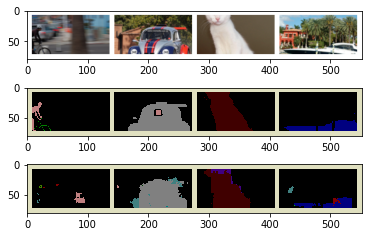

Train Epoch: 26 [640/1464 (43%)]	Loss: 0.469915


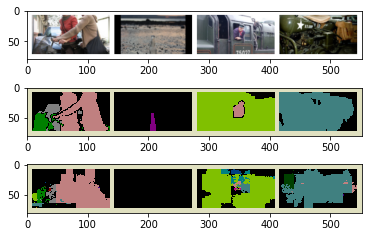

Train Epoch: 26 [1280/1464 (87%)]	Loss: 0.521726


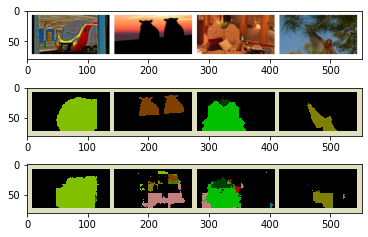

Train Epoch: 27 [0/1464 (0%)]	Loss: 0.486453


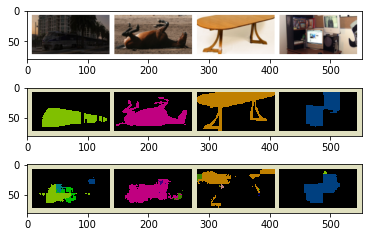

Train Epoch: 27 [640/1464 (43%)]	Loss: 0.503508


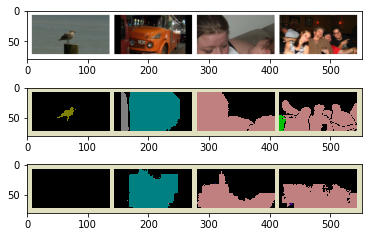

Train Epoch: 27 [1280/1464 (87%)]	Loss: 0.531155


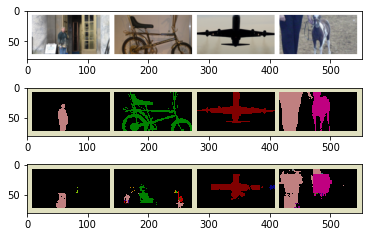

Train Epoch: 28 [0/1464 (0%)]	Loss: 0.568210


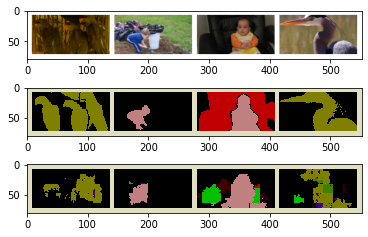

Train Epoch: 28 [640/1464 (43%)]	Loss: 0.487219


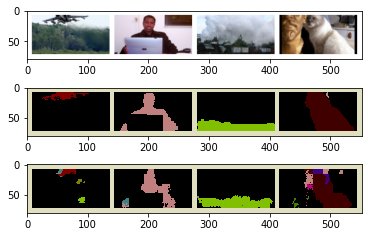

Train Epoch: 28 [1280/1464 (87%)]	Loss: 0.538503


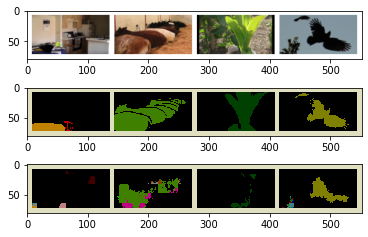

Train Epoch: 29 [0/1464 (0%)]	Loss: 0.487025


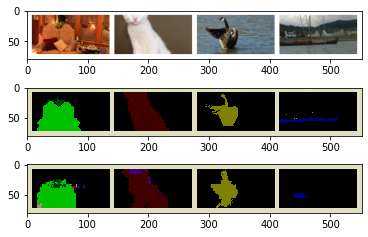

Train Epoch: 29 [640/1464 (43%)]	Loss: 0.449770


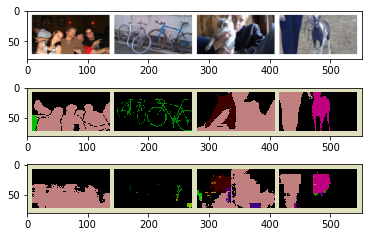

Train Epoch: 29 [1280/1464 (87%)]	Loss: 0.426477


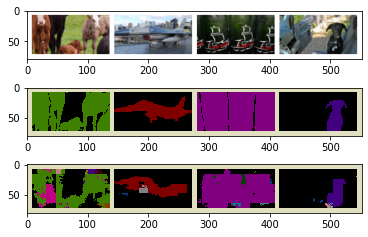

Train Epoch: 30 [0/1464 (0%)]	Loss: 0.491451


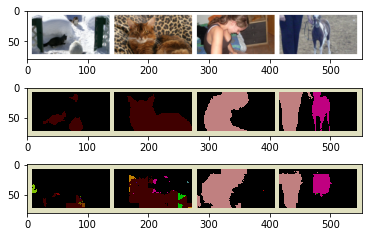

Train Epoch: 30 [640/1464 (43%)]	Loss: 0.435291


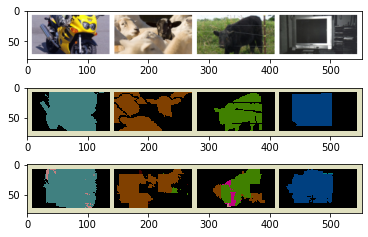

Train Epoch: 30 [1280/1464 (87%)]	Loss: 0.398916


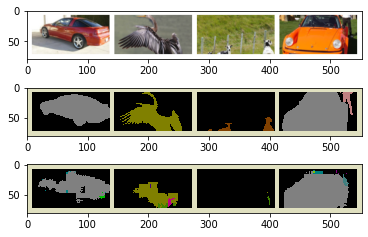

Train Epoch: 31 [0/1464 (0%)]	Loss: 0.480183


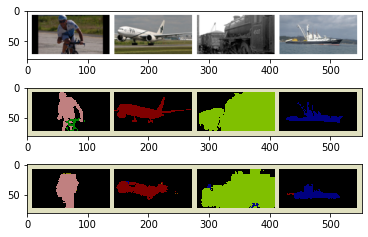

Train Epoch: 31 [640/1464 (43%)]	Loss: 0.503421


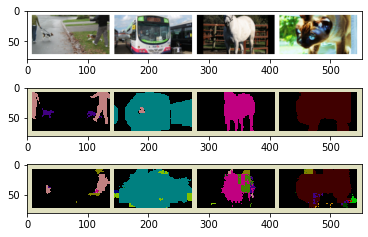

Train Epoch: 31 [1280/1464 (87%)]	Loss: 0.578237


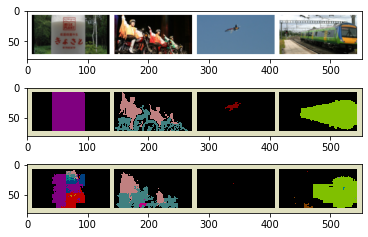

Train Epoch: 32 [0/1464 (0%)]	Loss: 0.491598


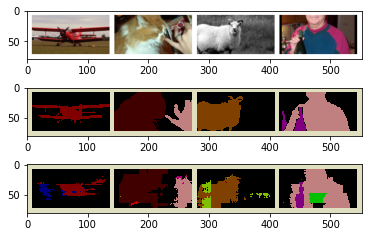

Train Epoch: 32 [640/1464 (43%)]	Loss: 0.501718


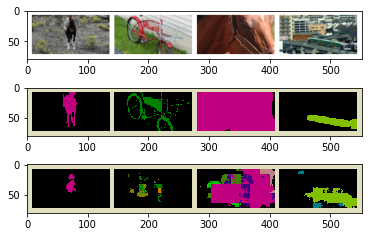

Train Epoch: 32 [1280/1464 (87%)]	Loss: 0.539331


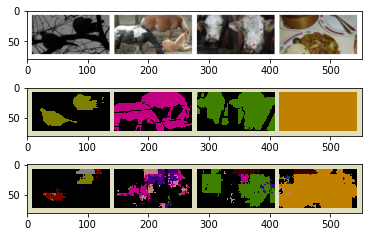

Train Epoch: 33 [0/1464 (0%)]	Loss: 0.512692


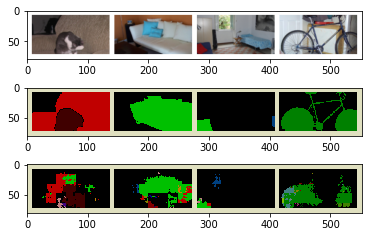

Train Epoch: 33 [640/1464 (43%)]	Loss: 0.463397


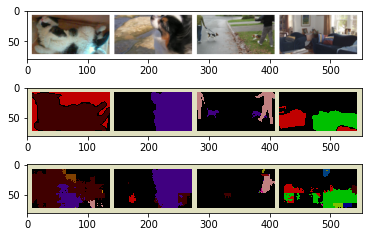

Train Epoch: 33 [1280/1464 (87%)]	Loss: 0.404487


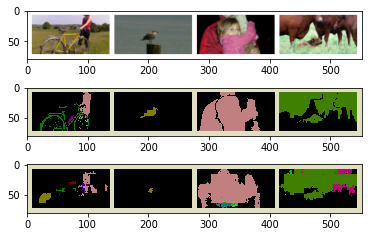

Train Epoch: 34 [0/1464 (0%)]	Loss: 0.446577


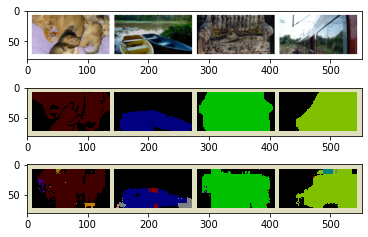

Train Epoch: 34 [640/1464 (43%)]	Loss: 0.463133


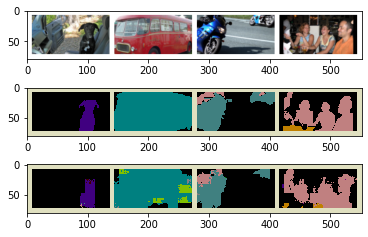

Train Epoch: 34 [1280/1464 (87%)]	Loss: 0.352396


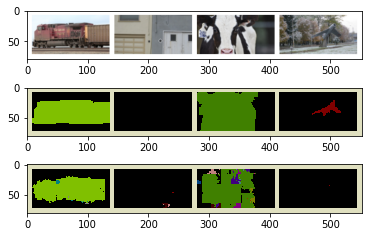

Train Epoch: 35 [0/1464 (0%)]	Loss: 0.468852


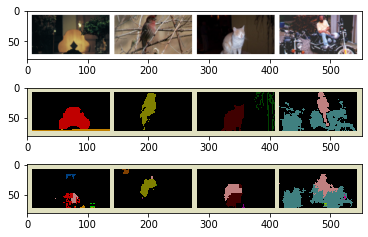

Train Epoch: 35 [640/1464 (43%)]	Loss: 0.424441


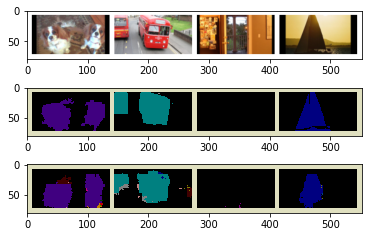

Train Epoch: 35 [1280/1464 (87%)]	Loss: 0.416664


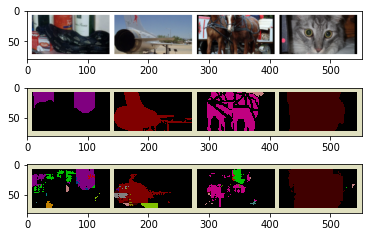

Train Epoch: 36 [0/1464 (0%)]	Loss: 0.432039


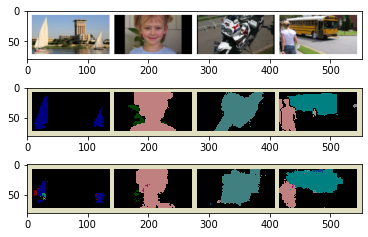

Train Epoch: 36 [640/1464 (43%)]	Loss: 0.411821


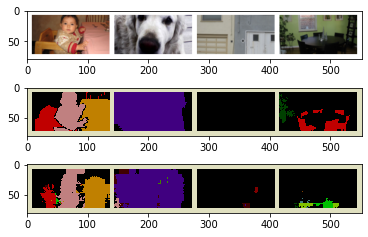

Train Epoch: 36 [1280/1464 (87%)]	Loss: 0.426450


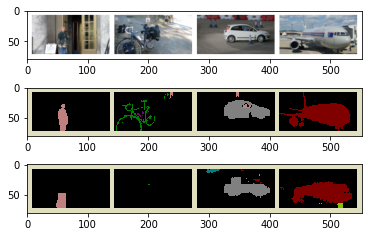

Train Epoch: 37 [0/1464 (0%)]	Loss: 0.319294


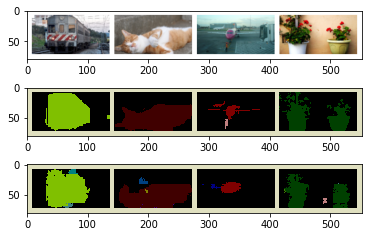

Train Epoch: 37 [640/1464 (43%)]	Loss: 0.371570


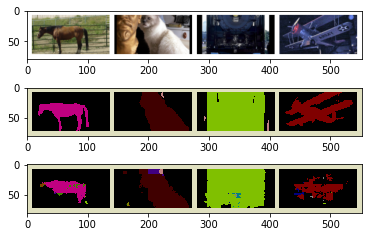

Train Epoch: 37 [1280/1464 (87%)]	Loss: 0.336144


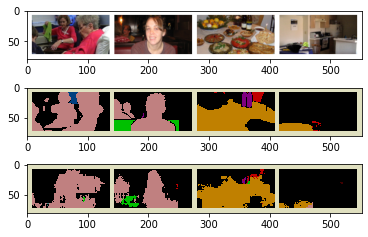

Train Epoch: 38 [0/1464 (0%)]	Loss: 0.362498


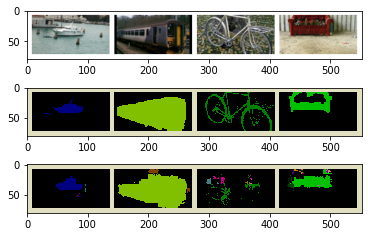

Train Epoch: 38 [640/1464 (43%)]	Loss: 0.399871


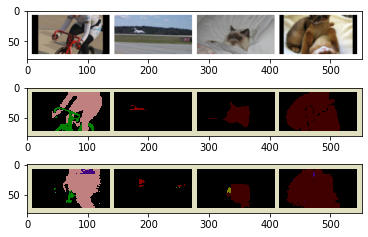

Train Epoch: 38 [1280/1464 (87%)]	Loss: 0.432659


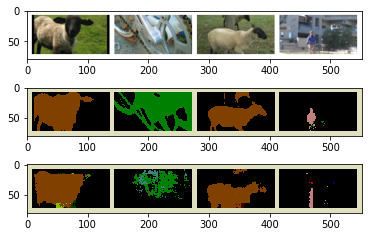

Train Epoch: 39 [0/1464 (0%)]	Loss: 0.397726


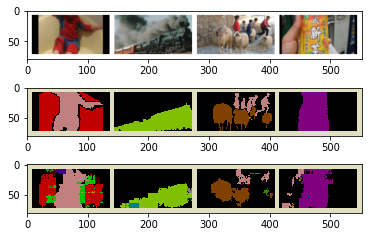

Train Epoch: 39 [640/1464 (43%)]	Loss: 0.451937


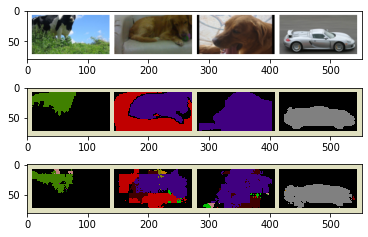

Train Epoch: 39 [1280/1464 (87%)]	Loss: 0.344129


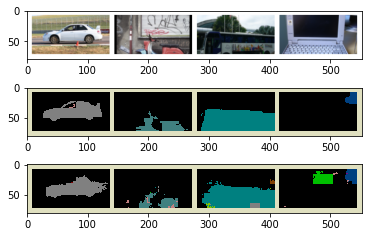

Train Epoch: 40 [0/1464 (0%)]	Loss: 0.364928


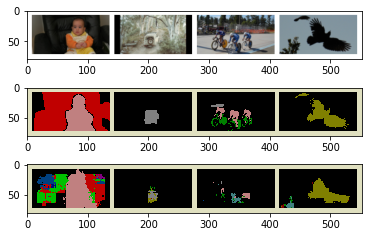

Train Epoch: 40 [640/1464 (43%)]	Loss: 0.384795


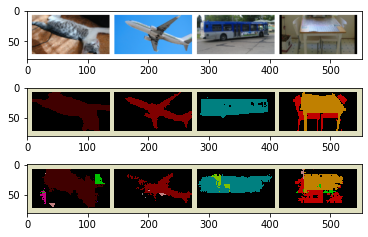

Train Epoch: 40 [1280/1464 (87%)]	Loss: 0.336257


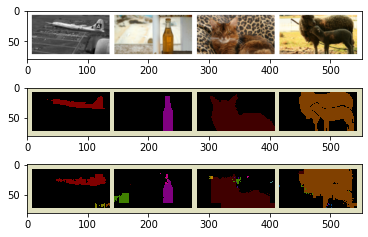

Train Epoch: 41 [0/1464 (0%)]	Loss: 0.351600


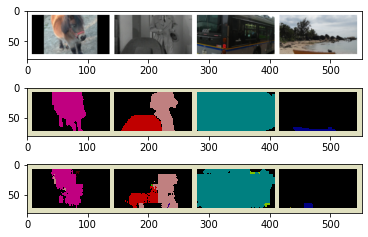

Train Epoch: 41 [640/1464 (43%)]	Loss: 0.363485


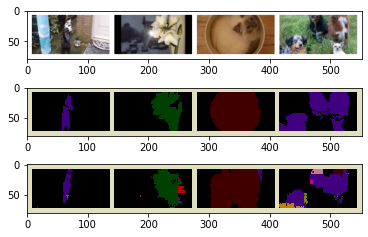

Train Epoch: 41 [1280/1464 (87%)]	Loss: 0.335029


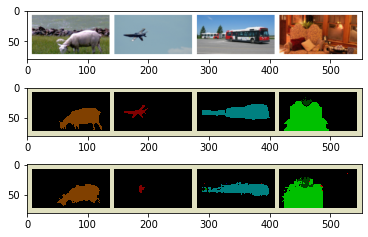

Train Epoch: 42 [0/1464 (0%)]	Loss: 0.329286


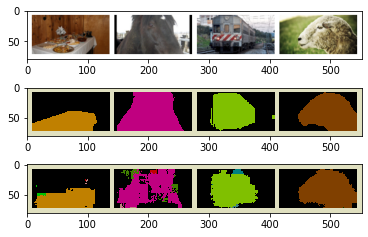

Train Epoch: 42 [640/1464 (43%)]	Loss: 0.448962


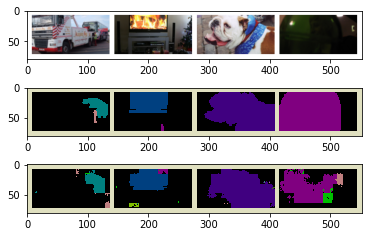

Train Epoch: 42 [1280/1464 (87%)]	Loss: 0.344034


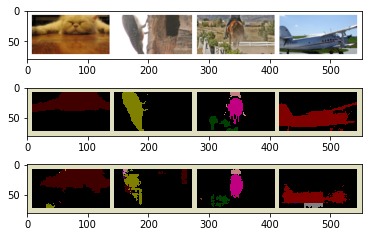

Train Epoch: 43 [0/1464 (0%)]	Loss: 0.323945


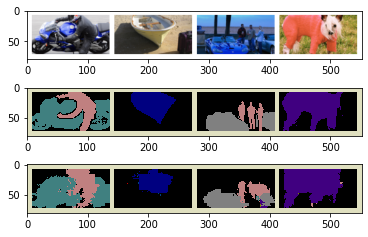

Train Epoch: 43 [640/1464 (43%)]	Loss: 0.335523


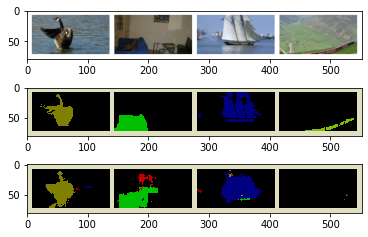

Train Epoch: 43 [1280/1464 (87%)]	Loss: 0.397346


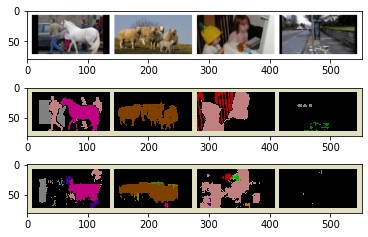

Train Epoch: 44 [0/1464 (0%)]	Loss: 0.345548


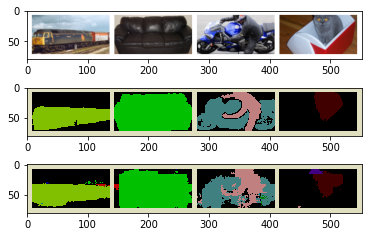

Train Epoch: 44 [640/1464 (43%)]	Loss: 0.294934


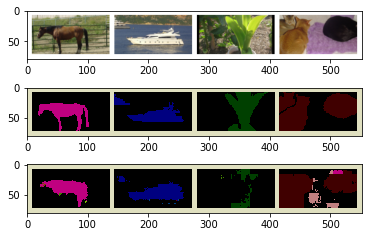

Train Epoch: 44 [1280/1464 (87%)]	Loss: 0.402559


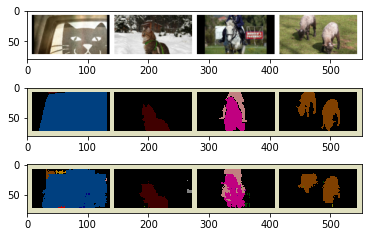

Train Epoch: 45 [0/1464 (0%)]	Loss: 0.366389


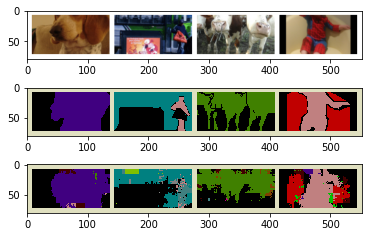

Train Epoch: 45 [640/1464 (43%)]	Loss: 0.338038


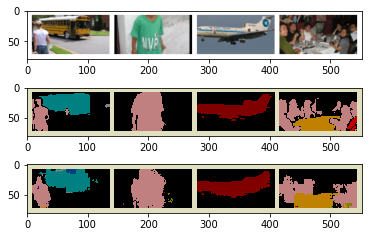

Train Epoch: 45 [1280/1464 (87%)]	Loss: 0.347090


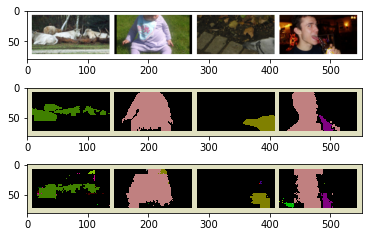

Train Epoch: 46 [0/1464 (0%)]	Loss: 0.431446


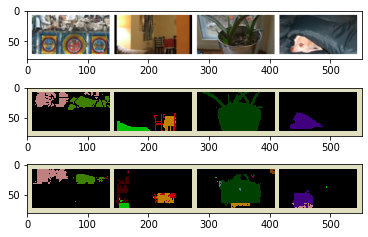

Train Epoch: 46 [640/1464 (43%)]	Loss: 0.352130


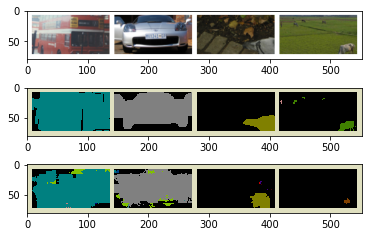

Train Epoch: 46 [1280/1464 (87%)]	Loss: 0.278357


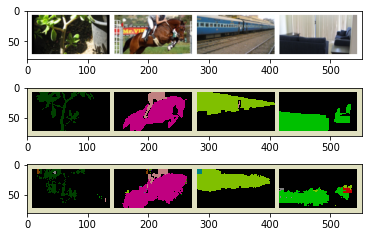

Train Epoch: 47 [0/1464 (0%)]	Loss: 0.313510


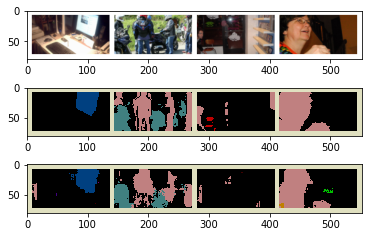

Train Epoch: 47 [640/1464 (43%)]	Loss: 0.349377


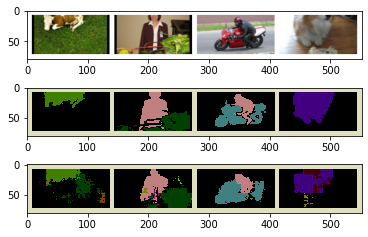

Train Epoch: 47 [1280/1464 (87%)]	Loss: 0.380625


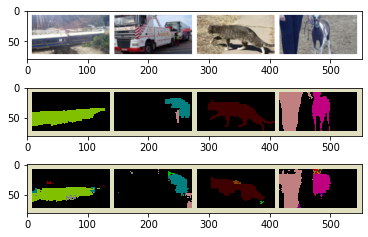

Train Epoch: 48 [0/1464 (0%)]	Loss: 0.258687


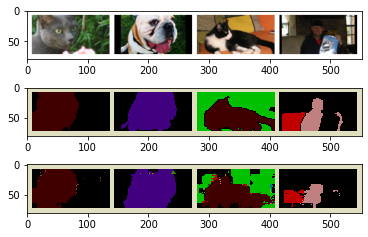

Train Epoch: 48 [640/1464 (43%)]	Loss: 0.367612


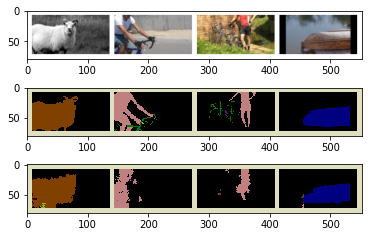

Train Epoch: 48 [1280/1464 (87%)]	Loss: 0.356538


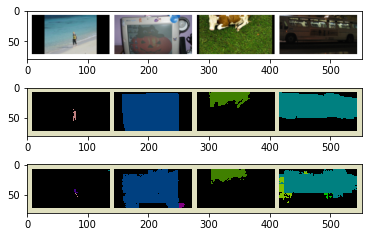

Train Epoch: 49 [0/1464 (0%)]	Loss: 0.306160


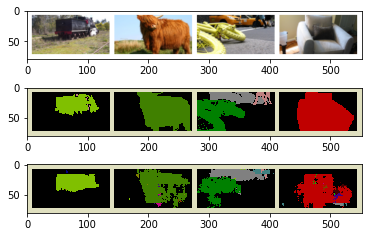

Train Epoch: 49 [640/1464 (43%)]	Loss: 0.324559


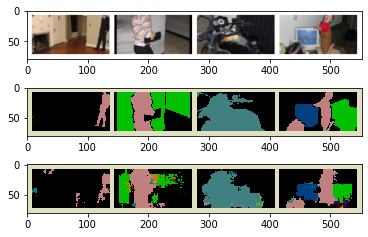

Train Epoch: 49 [1280/1464 (87%)]	Loss: 0.328144


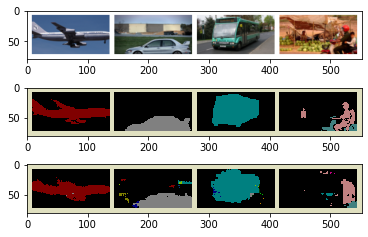

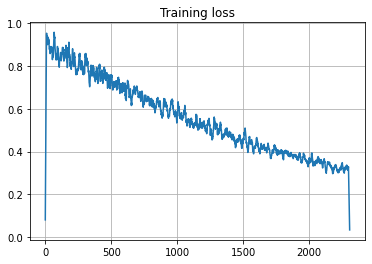

In [ ]:
train(net3, lr=1e-3, epochs=50, log_interval=20)

# Homework - U-Net

## U-Net

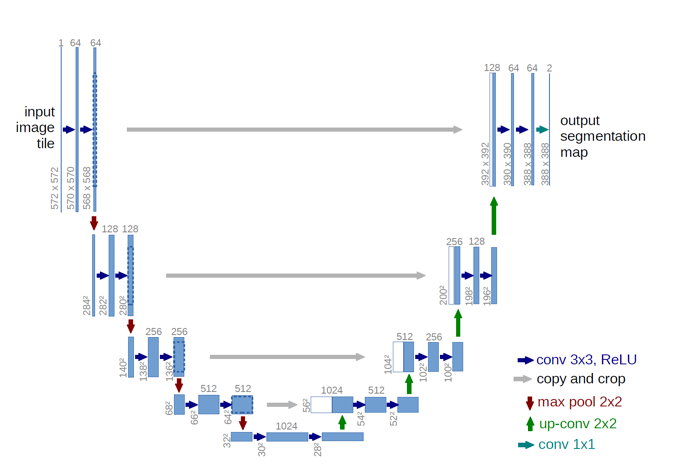

## IOU

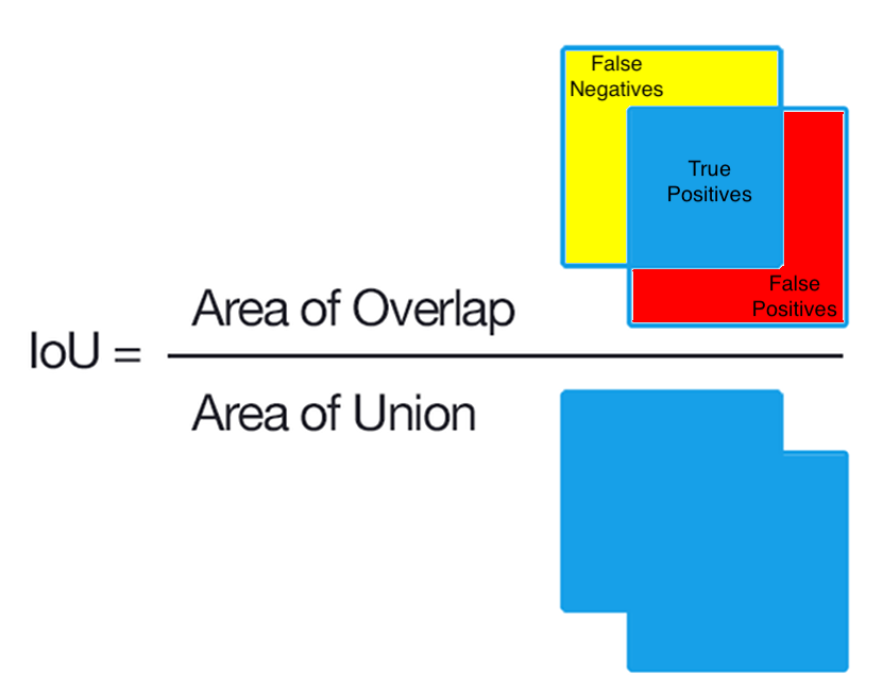